
 ---
# <u>ETL y EDA  - ANÁLISIS DE SINIESTROS VIALES CABA </u>
---


## 1-Librerías utilizadas

In [168]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import squarify
import folium
from folium.plugins import HeatMap
import warnings
# Ignorar todas las advertencias
warnings.filterwarnings("ignore")

## 2- Importación de datasets

In [2]:
## Improtación de datasets
homicidios_hechos = pd.read_excel("M:\\Documentos\\Mai\\Henry\\Cursado\\P.I. 2\\1. Base de datos\\Homicidios - HECHOS.xlsx")
homicidios_victimas = pd.read_excel("M:\\Documentos\\Mai\\Henry\\Cursado\\P.I. 2\\1. Base de datos\\Homicidios - VICTIMAS.xlsx")


## 3- Descripción general de los datasets.

Los pricipales datasets sobre los que trabajaremos son los siguientes:
* HECHOS: contiene una fila por hecho con id único y las variables asociadas: temporales, espaciales Y participantes.
* VICTIMAS: contiene una fila por cada víctima de los hechos junto con sus variables asociadas: edad, sexo y modo de desplazamiento . 
Se vincula a los hechos mediante el ID del hecho.

Asimismo se cuenta con dos archivos complementarios:
* DICCIONARIO_HECHOS: contiene las definiciones de cada variable de la solapa HECHOS y las definiciones de los distintos valores de cada variable.
* DICCIONARIO_VICTIMAS: contiene las definiciones de cada variable de la solapa VICTIMAS y  las definiciones de los distintos valores de cada variable


Fuente: https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte-y-obras-publicas/victimas-siniestros-viales/NOTAS_SINIESTROS_VIALES_2019-2023.pdf

 ---
# ***HECHOS***
---

## 4- Análisis preliminares y generales (HECHOS)

Se obtiene información general y se revisa si hay valores nulos y faltantes

In [3]:
homicidios_hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     696 non-null    object        
 1   N_VICTIMAS             696 non-null    int64         
 2   FECHA                  696 non-null    datetime64[ns]
 3   AAAA                   696 non-null    int64         
 4   MM                     696 non-null    int64         
 5   DD                     696 non-null    int64         
 6   HORA                   696 non-null    object        
 7   HH                     696 non-null    object        
 8   LUGAR_DEL_HECHO        696 non-null    object        
 9   TIPO_DE_CALLE          696 non-null    object        
 10  Calle                  695 non-null    object        
 11  Altura                 129 non-null    float64       
 12  Cruce                  525 non-null    object        
 13  Direc

In [4]:
homicidios_hechos.info()
#Se Observan la mayor cantidad de nulos en columnas [Altura], [Cruce], [Dirección Normalizada]
#Se observan dos columnas que podrían tener información duplicada a revisar [HH] y [Hora]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     696 non-null    object        
 1   N_VICTIMAS             696 non-null    int64         
 2   FECHA                  696 non-null    datetime64[ns]
 3   AAAA                   696 non-null    int64         
 4   MM                     696 non-null    int64         
 5   DD                     696 non-null    int64         
 6   HORA                   696 non-null    object        
 7   HH                     696 non-null    object        
 8   LUGAR_DEL_HECHO        696 non-null    object        
 9   TIPO_DE_CALLE          696 non-null    object        
 10  Calle                  695 non-null    object        
 11  Altura                 129 non-null    float64       
 12  Cruce                  525 non-null    object        
 13  Direc

In [5]:
#Detectar cantidad exacta de nulos
homicidios_hechos.isnull().sum()

ID                         0
N_VICTIMAS                 0
FECHA                      0
AAAA                       0
MM                         0
DD                         0
HORA                       0
HH                         0
LUGAR_DEL_HECHO            0
TIPO_DE_CALLE              0
Calle                      1
Altura                   567
Cruce                    171
Dirección Normalizada      8
COMUNA                     0
XY (CABA)                  0
pos x                      0
pos y                      0
PARTICIPANTES              0
VICTIMA                    0
ACUSADO                    0
dtype: int64

Se crea un informe de análisis exploratorio de datos (EDA) usando ProfileReport de la librería ydata_profiling (anteriormente conocida como pandas_profiling).

In [6]:
#genera un informe completo basado en el DataFrame
profile = ProfileReport(homicidios_hechos, title="EDA de Hechos", explorative=True)

# muestra ese informe en un Jupyter Notebook como un iframe, permitiendo la interacción y exploración dentro del entorno de trabajo
profile.to_notebook_iframe() 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# Guardar Reporte General de Hechos
profile.to_file('..\\3. Reportes Profiling\\' + "Reporte_Profile_HECHOS_1.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Analisis de duplicados:

In [8]:
# Detectar filas duplicadas en todas las columnas
duplicadas = homicidios_hechos.duplicated(keep=False)

# Mostrar solo las filas duplicadas
filas_duplicadas = homicidios_hechos[duplicadas]
filas_duplicadas
#Se corrobora que no hay filas duplicadas.


,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,Altura,Cruce,Dirección Normalizada,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO


## 5- Análisis Univariable (HECHOS)

Detalle resumido de las columnas del DataSet
***Variable*** | ***Tipo de dato***| ***Descripción*** 
--- | ---| --- 
ID | str| Identificador único de cada homicidio 
N_VICTIMAS | int64| Número de víctimas en el homicidio 
FECHA | datetime64[ns]| Fecha del homicidio 
MM | int64| Mes del homicidio 
DD | int64| Día del mes del homicidio 
HORA | object| Hora del homicidio en formato HH:MM:SS 
HH | object| Hora del homicidio en formato HH 
LUGAR_DEL_HECHO | object| Lugar donde ocurrió el homicidio 
LUGAR_DEL_HECHO | object| Tipo de calle donde ocurrió el homicidio 
Calle | object| Nombre de la calle donde ocurrió el homicidio 
Altura | float64| Altura de la calle donde ocurrió el homicidio 
Cruce | object| Calle que cruza con la calle donde ocurrió el homicidio 
Dirección normalizada | object| Dirección normalizada del lugar del homicidio 
Comuna | int64| Comuna donde ocurrió el homicidio 
Xy (caba) | object| Coordenadas X e Y del lugar del homicidio 
Pos X | object| Coordenada X del lugar del homicidio 
Pos y | object| Coordenada Y del lugar del homicidio 
Participantes | object| Información sobre los participantes en el homicidio 
Victima | object| Información sobre la víctima del homicidio 
Acusado | object| Información sobre el acusado del homicidio 


### COLUMNA: ID

Si bien se detectó que no existen filas duplicadas se analiza que todos los ID sean valores únicos, no existan duplicados ni nulos

In [9]:
# Mostrar los Ids duplicados
duplicados = homicidios_hechos[homicidios_hechos.duplicated(subset='ID', keep=False)]
duplicados

#Se entiende que todos los ID son únicos y sin duplicados

,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,Altura,Cruce,Dirección Normalizada,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO


In [10]:
# Mostrar los Ids nulos
nulos_id = homicidios_hechos['ID'].isnull().sum()
nulos_id

#No existen nulos

0

In [11]:
# Contar cuántos valores son iguales a "S/D" en la columna 'Id'
valores_sd = (homicidios_hechos['ID'] == "SD").sum()
valores_sd
#No existen valores S/D

0

In [12]:
#Convertir a string para un mejor manejo del dato 
homicidios_hechos['ID'] = homicidios_hechos['ID'].astype(str)

### COLUMNA: N_VICTIMAS


Se analiza la presencia de nulos o valores "Sin Datos", y una estadistica descriptiva para la columna

In [13]:
# Verificar valores nulos
valores_faltantes = homicidios_hechos['N_VICTIMAS'].isnull().sum()
valores_faltantes
# No existen valores nulos


0

In [14]:
# Contar cuántos valores son iguales a "S/D" en la columna 'Id'
valores_sd = (homicidios_hechos['N_VICTIMAS'] == "SD").sum()
valores_sd
#No existen valores S/D

0

In [15]:
# Estadísticas descriptivas
estadisticas = homicidios_hechos['N_VICTIMAS'].describe()
estadisticas
#

count    696.000000
mean       1.030172
std        0.179393
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        3.000000
Name: N_VICTIMAS, dtype: float64

Se calcula el número total de victimas y se realiza gráfico de barras que muestre la frecuencia de homicidios por número de víctimas 

In [16]:
total_victimas = homicidios_hechos['N_VICTIMAS'].sum()
total_victimas

717

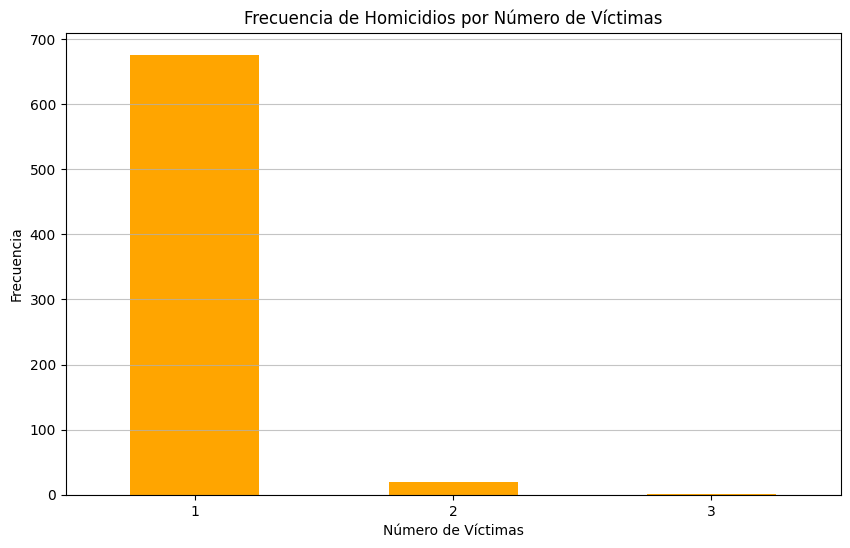

In [17]:
# Gráfico de barras
frecuencia_victimas = homicidios_hechos['N_VICTIMAS'].value_counts().sort_index()
frecuencia_victimas.plot(kind='bar', figsize=(10, 6), color='orange')
plt.title('Frecuencia de Homicidios por Número de Víctimas')
plt.xlabel('Número de Víctimas')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.75)
plt.show()
#Se puede observar que practicamente la mayoria de los incidentes tienen 1 sola víctima

### COLUMNAS FECHA: (FECHA AAAA MM DD HORA HH )


FECHA: Se analiza tipos de dato, estadísticas y nulos

In [18]:
# Comprobar el tipo de dato FECHA
print(homicidios_hechos['FECHA'].dtype)

datetime64[ns]


In [19]:
# # Estadísticas descriptivas FECHA
estadísticas = homicidios_hechos['FECHA'].describe()
estadísticas
#Las fechas van desde 01-01-2016 a 30-12-2021

count                              696
mean     2018-09-14 05:12:24.827586048
min                2016-01-01 00:00:00
25%                2017-04-02 12:00:00
50%                2018-07-12 12:00:00
75%                2020-01-04 06:00:00
max                2021-12-30 00:00:00
Name: FECHA, dtype: object

In [20]:
# Contar valores nulos FECHA
nulos_fecha = homicidios_hechos['FECHA'].isnull().sum()
nulos_fecha

0

AAAA: Se analiza tipos de dato, estadísticas y nulos

In [21]:
# Comprobar el tipo de dato AAAA
print(homicidios_hechos['AAAA'].dtype)

int64


In [22]:
# # Estadísticas descriptivas AAAA
estadísticas = homicidios_hechos['AAAA'].describe()
estadísticas
#Los años van desde 2016 a 2021

count     696.000000
mean     2018.188218
std         1.683754
min      2016.000000
25%      2017.000000
50%      2018.000000
75%      2020.000000
max      2021.000000
Name: AAAA, dtype: float64

In [23]:
# Contar valores nulos AAAA
nulos_aaaa = homicidios_hechos['AAAA'].isnull().sum()
nulos_aaaa

0

MM: Se analiza tipos de dato, estadísticas y nulos

In [24]:
# Comprobar el tipo de dato MM
print(homicidios_hechos['MM'].dtype)

int64


In [25]:
# # Estadísticas descriptivas MM
estadísticas = homicidios_hechos['MM'].describe()
estadísticas


count    696.000000
mean       6.692529
std        3.571309
min        1.000000
25%        4.000000
50%        7.000000
75%       10.000000
max       12.000000
Name: MM, dtype: float64

In [26]:
# Contar valores nulos MM
nulos_mm = homicidios_hechos['MM'].isnull().sum()
nulos_mm

0

DD: Se analiza tipos de dato, estadísticas y nulos

In [27]:
# Comprobar el tipo de dato DD
print(homicidios_hechos['DD'].dtype)

int64


In [28]:
# # Estadísticas descriptivas DD
estadísticas = homicidios_hechos['DD'].describe()
estadísticas

count    696.000000
mean      15.936782
std        8.639646
min        1.000000
25%        9.000000
50%       16.000000
75%       23.000000
max       31.000000
Name: DD, dtype: float64

In [29]:
# Contar valores nulos DD
nulos_dd = homicidios_hechos['DD'].isnull().sum()
nulos_dd

0

HH: Se analiza tipos de dato, estadísticas y nulos

In [30]:
# Comprobar el tipo de dato HH
print(homicidios_hechos['HH'].dtype)

object


In [31]:
# Estadísticas descriptivas HH
estadísticas = homicidios_hechos['HH'].describe()
estadísticas

count     696
unique     25
top         7
freq       41
Name: HH, dtype: int64

In [32]:
# Contar valores nulos HH
nulos_dd = homicidios_hechos['HH'].isnull().sum()
nulos_dd

0

Se compara que la columna "FECHA" sea coincidente con la combinacion de "AAAA+MM+DD":

In [33]:
# Crear una nueva columna con la fecha formada por AAAA, MM y DD
homicidios_hechos['FECHA_combinada'] = pd.to_datetime(
    homicidios_hechos['AAAA'].astype(str) + '-' +
    homicidios_hechos['MM'].astype(str).str.zfill(2) + '-' +
    homicidios_hechos['DD'].astype(str).str.zfill(2),
    format='%Y-%m-%d'  # Formato correcto: AAAA-MM-DD
)
# Comparar las fechas
homicidios_hechos['Fecha_coincide'] = homicidios_hechos['FECHA'] == homicidios_hechos['FECHA_combinada']

# Mostrar las filas donde las fechas no coinciden
discrepancias = homicidios_hechos[homicidios_hechos['Fecha_coincide'] == False]
discrepancias



,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,Dirección Normalizada,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO,FECHA_combinada,Fecha_coincide
64,2016-0087,1,2016-07-02,2016,7,3,00:10:00,0,AUTOPISTA 1 SUR PTE ARTURO FRONDIZI Y AV CASEROS,AUTOPISTA,...,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI y C...,1,Point (107762.62066736 100018.90176187),-58.37864583,-34.62907067,MOTO-OBJETO FIJO,MOTO,OBJETO FIJO,2016-07-03,False


----->Se encuentra una diferentecia en el ID:2016-87 el cual se corrobora en el dataset de victimas para ese ID y resulta ser correcta la fecha 03/07/2016 se procede a corregir

In [34]:
# Corregir las fechas incorrectas
homicidios_hechos.loc[homicidios_hechos['Fecha_coincide'] == False, 'FECHA'] = homicidios_hechos['FECHA_combinada']

# Verificar si las discrepancias han sido corregidas
# Comparar las fechas
homicidios_hechos['Fecha_coincide'] = homicidios_hechos['FECHA'] == homicidios_hechos['FECHA_combinada']

# Mostrar las filas donde las fechas no coinciden
discrepancias = homicidios_hechos[homicidios_hechos['Fecha_coincide'] == False]
discrepancias

,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,Dirección Normalizada,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO,FECHA_combinada,Fecha_coincide


Se crea una columna nueva al dataset con el día de la semana

In [35]:
# Agregar columna para el día de la semana
homicidios_hechos['DIA_SEMANA'] = homicidios_hechos['FECHA'].dt.day_name()
#Creo un diccionario para modificar a español los nombres de los dás de la semana y lo aplico a la columna nueva
dic={  'Friday':'5. Viernes',
       'Saturday': '6. Sabado',
       'Sunday': '7. Domingo',  
       'Thursday': '4. Jueves',
        'Monday': '1. Lunes',
        'Wednesday': '3. Miercoles',
       'Tuesday': '2. Martes'}
homicidios_hechos['DIA_SEMANA'] =homicidios_hechos['DIA_SEMANA'].replace(dic)

Se crea un histograma para visualizar la distribución de los homicidios a lo largo del tiempo.

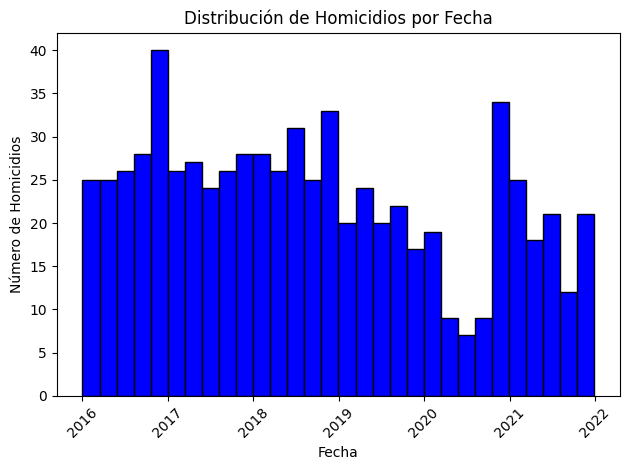

In [36]:
plt.hist(homicidios_hechos['FECHA'], bins=30, color='blue', edgecolor='black')
plt.title('Distribución de Homicidios por Fecha')
plt.xlabel('Fecha')
plt.ylabel('Número de Homicidios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


-----> Se puede observar como existen algunos picos marcados sobre fines de 2016 y 2020, mientrás que la epoca con menor cantidad de homicidios se da durante mediados de 2020, posiblemente por la restricción vehicular a causa de la pandemia COVID-19

Se realiza un gráfico para mostrar la tendencia a lo largo del tiempo mas en detalle

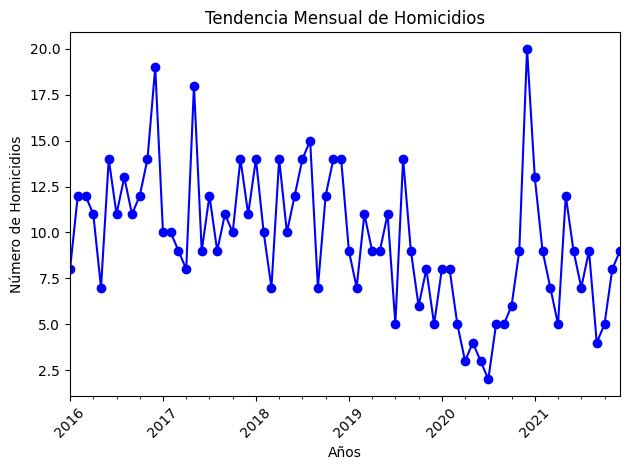

In [164]:
# Agrupar por mes y contar homicidios
homicidios_por_mes = homicidios_hechos.groupby(homicidios_hechos['FECHA'].dt.to_period('M')).size()

# Graficar tendencias mensuales
homicidios_por_mes.plot(kind='line', color='blue', marker='o')
plt.title('Tendencia Mensual de Homicidios')
plt.xlabel('Años')
plt.ylabel('Número de Homicidios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


-----> Se puede observar con mayor segregación y se confirma la existencia de algunos picos marcados sobre fines de 2016 y 2020, mientrás que la epoca con menor cantidad de homicidios se da durante mediados de 2020.

Se divide esa distribución por año para ver si existe algun patrón para detectar entre los diferentes años

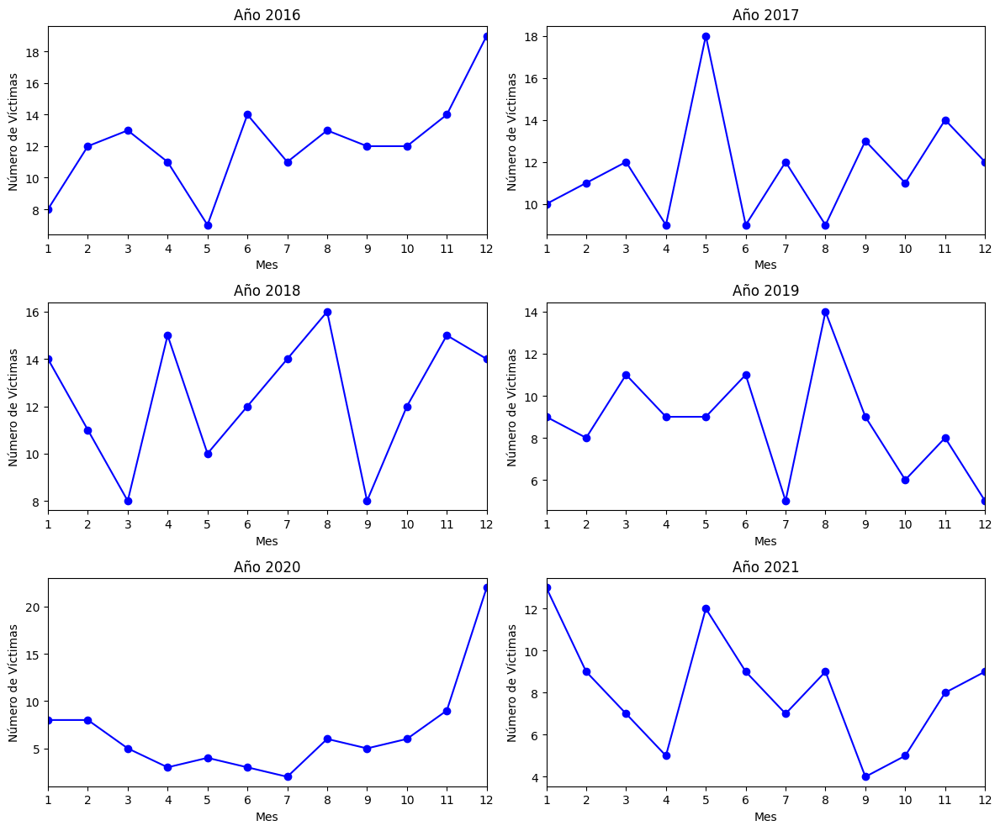

In [38]:
# Agrupar por Año y Mes, sumar la cantidad de víctimas
df_agrupado = homicidios_hechos.groupby(['AAAA', 'MM'])['N_VICTIMAS'].sum().reset_index()

# Obtener los años únicos para hacer un gráfico por año
años = df_agrupado['AAAA'].unique()

# Crear una figura con 2 columnas y 3 filas
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))  # Ajustar el tamaño según sea necesario

# Aplanar los ejes para recorrerlos fácilmente
axes = axes.flatten()

# Graficar cada año en su propio subplot
for i, year in enumerate(años):
    data_year = df_agrupado[df_agrupado['AAAA'] == year]
    axes[i].plot(data_year['MM'], data_year['N_VICTIMAS'], marker='o', linestyle='-', color='b')
    axes[i].set_title(f'Año {year}')
    axes[i].set_xlabel('Mes')
    axes[i].set_ylabel('Número de Víctimas')
    axes[i].set_xticks(range(1, 13))  # Asegurarse de que se muestren todos los meses
    axes[i].set_xlim(1, 12)  # Limitar el eje X de 1 a 12 (meses)

# Ajustar el diseño del gráfico
plt.tight_layout()
plt.show()

---->No se observan patrones claro que se repitan año a añoa, pero si se puede ver como la pandemia tuvo relación directa en la disminución de victimas en 2020


Se realiza un grafico para ver la distribución por día de la semana, por meses y por año para verificar si hay días, meses o años con más homicidios

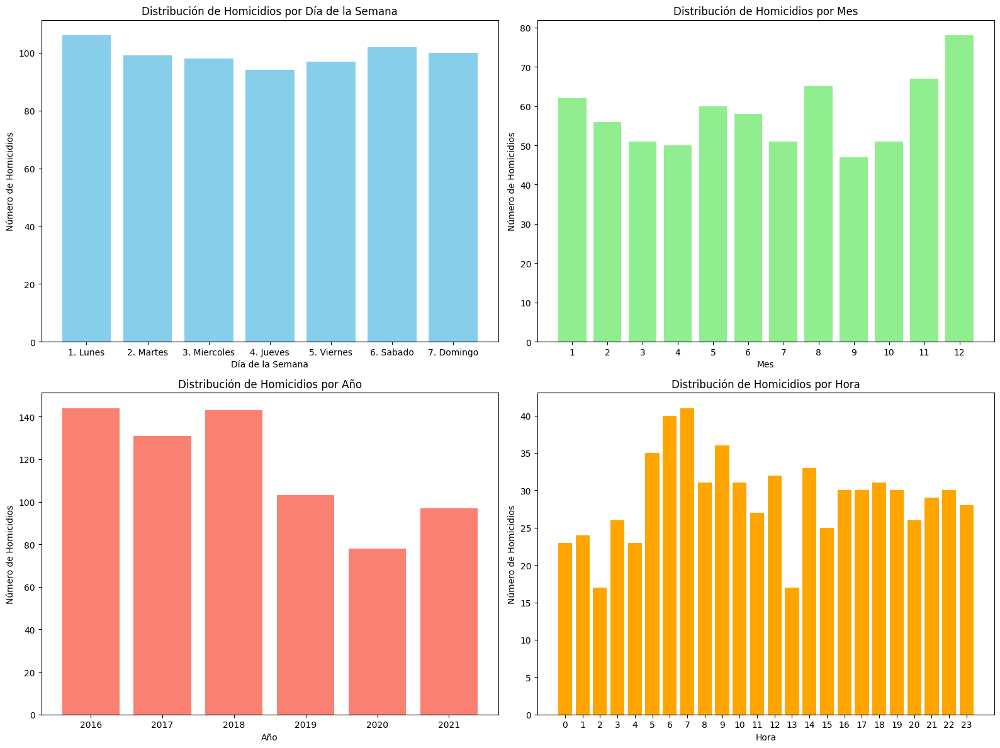

In [39]:
# Agrupar por Día de la Semana
distribucion_dia_semana = homicidios_hechos['DIA_SEMANA'].value_counts().sort_index()

# Agrupar por Mes (MM)
distribucion_mes = homicidios_hechos['MM'].value_counts().sort_index()

# Agrupar por Año (AAAA)
distribucion_año = homicidios_hechos['AAAA'].value_counts().sort_index()

# Agrupar por Hora (HH)
# Convertir la columna 'HH' a numérica, reemplazar valores no numéricos por NaN
homicidios_hechos['HH'] = pd.to_numeric(homicidios_hechos['HH'], errors='coerce')
homicidios_hechos_filtrado = homicidios_hechos.dropna(subset=['HH'])
distribucion_hora = homicidios_hechos_filtrado['HH'].value_counts().sort_index()

# Crear la figura y los 4 subplots (2x2)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# Gráfico de distribución por Día de la Semana
axes[0, 0].bar(distribucion_dia_semana.index, distribucion_dia_semana.values, color='skyblue')
axes[0, 0].set_title('Distribución de Homicidios por Día de la Semana')
axes[0, 0].set_xlabel('Día de la Semana')

axes[0, 0].set_ylabel('Número de Homicidios')

# Gráfico de distribución por Mes (MM)
axes[0, 1].bar(distribucion_mes.index, distribucion_mes.values, color='lightgreen')
axes[0, 1].set_title('Distribución de Homicidios por Mes')
axes[0, 1].set_xlabel('Mes')
axes[0, 1].set_xticks(range(1, 13))
axes[0, 1].set_ylabel('Número de Homicidios')

# Gráfico de distribución por Año (AAAA)
axes[1, 0].bar(distribucion_año.index, distribucion_año.values, color='salmon')
axes[1, 0].set_title('Distribución de Homicidios por Año')
axes[1, 0].set_xlabel('Año')
axes[1, 0].set_ylabel('Número de Homicidios')

# Gráfico de distribución por Hora (HH)
axes[1, 1].bar(distribucion_hora.index, distribucion_hora.values, color='orange')
axes[1, 1].set_title('Distribución de Homicidios por Hora')
axes[1, 1].set_xlabel('Hora')
axes[1, 1].set_xticks(range(0, 24))
axes[1, 1].set_ylabel('Número de Homicidios')

# Ajustar el espaciado
plt.tight_layout()

# Mostrar el gráfico
plt.show()


----> Se observan las siguientes conclusiones:
> - Lunes y sábados son los dáas con mayor cantidad de accidentes pero no existe un día que se destaque por sobre el resto
> - Diciembre es el mes con mayor cantidad de sucesos fatales, lo que se puede llegar a asumir que se debe a las Fiestas de Fin de año que suponen mayores eventos sociales y consumo de alcohol
> - Respecto a los años, se nota una disminución importante despues de 2019, sin embargo la presencia de la pandemia durante 2020 claramente impacto en los resultados.
> - En el horario que va desde las 6 a 7 de la mañana es el horario con mas frecuencia de accidentes/homicidios, y como las 2 am y 13 hs. los horarios con menos frecuencia.

### COLUMNAS UBICACIÓN: (LUGAR_DEL_HECHO CALLE ALTURA CRUCE	DIRECCION_NORMALIZADA)

Según se consulto en la siguiente URL del Gob. de Ciudad de Buenos Aires : https://usig.buenosaires.gob.ar/manual_normalizador_de_direcciones_USIG.pdf
* La DIRECCIÓN NORMALIZADA se forma por:
    - Calle + Altura (si no sucede en esquina)
    - Calle + Cruce (si sucede en esquina)

Se procede analizar valores nulos e incompletos

In [40]:
# Filtrar filas donde 'Calle' sea nula
nulo_calle = homicidios_hechos[homicidios_hechos['Calle'].isna()]
nulo_calle
# Se detecta el ID:2016-0151 sin datos de ubicación

,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO,FECHA_combinada,Fecha_coincide,DIA_SEMANA
119,2016-0151,1,2016-11-18,2016,11,18,20:35:00,20.0,SD,CALLE,...,0,Point (. .),.,.,PEATON-SD,PEATON,SD,2016-11-18,True,5. Viernes


Tal como se analizó previamente una dirección tiene que tener al menos una altura o un cruce, por ende se analiza aquellos datos que no tienen ninguna de las dos cosas

In [41]:
filtrado_altura_cruce = homicidios_hechos[homicidios_hechos['Altura'].isna() & homicidios_hechos['Cruce'].isna()]
filtrado_altura_cruce.loc[:, ['LUGAR_DEL_HECHO', 'Calle', 'Altura', 'Cruce', 'Dirección Normalizada']].head()

,LUGAR_DEL_HECHO,Calle,Altura,Cruce,Dirección Normalizada
35,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI KM....,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,NaN,NaN,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI
38,AUTOPISTA LUGONES PK 10000,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN
64,AUTOPISTA 1 SUR PTE ARTURO FRONDIZI Y AV CASEROS,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,NaN,NaN,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI y C...
71,"AUTOPISTA DELLEPIANE LUIS TTE. GRAL. KM. 2,3",AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,NaN,NaN,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.
81,AUTOPISTA 9 DE JULIO SUR ALT AV MENDOZA,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,NaN,NaN,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI y D...


Para futuros analisis se considera importante crear una columna que aclare si el accidente fue en esquina (es decir en el cruce de dos calles) o si no lo fue.

In [42]:
# Crear la columna "Esquina" que tiene como valor True si "Cruce" tiene algún valor, y  False si está vacío
homicidios_hechos['Esquina'] = homicidios_hechos['Cruce'].notnull()
homicidios_hechos.loc[:, ['LUGAR_DEL_HECHO', 'Calle', 'Altura', 'Cruce', 'Dirección Normalizada', 'Esquina']].head()

,LUGAR_DEL_HECHO,Calle,Altura,Cruce,Dirección Normalizada,Esquina
0,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",True
1,AV GRAL PAZ Y AV DE LOS CORRALES,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",True
2,AV ENTRE RIOS 2034,ENTRE RIOS AV.,2034.0,NaN,ENTRE RIOS AV. 2034,False
3,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",True
4,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",True


### COLUMNA: COMUNA

Según diccionario los valores pueden ser valores del 1 a 15

Se analizan valores nulos o sin datos, valores únicos y distribuciones

In [43]:
# Verificar valores nulos
valores_faltantes = homicidios_hechos['COMUNA'].isnull().sum()
valores_faltantes

0

----> No existen valores nulos

In [44]:
# Verificar si los valores unicos se corresponden con los del dicc del dataset
valores_unicos = homicidios_hechos['COMUNA'].unique()
valores_unicos.sort()
valores_unicos


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
      dtype=int64)

---->No Concuerdan con el diccionario, existen valores = 0.

In [45]:
# Reemplazar los valores 0 por NaN
homicidios_hechos['COMUNA'] = homicidios_hechos['COMUNA'].replace(0, np.nan)

# Asegurar que la columna sigue siendo de tipo entero, excepto los NaN
homicidios_hechos['COMUNA'] = homicidios_hechos['COMUNA'].astype('Int64')  


In [46]:
#obtener la distribución de cada comuna
frecuencia_comunas = homicidios_hechos['COMUNA'].value_counts()
frecuencia_comunas


COMUNA
1     90
4     76
9     73
8     65
7     60
3     45
15    44
13    40
12    37
14    35
11    32
10    29
2     25
5     22
6     21
Name: count, dtype: Int64

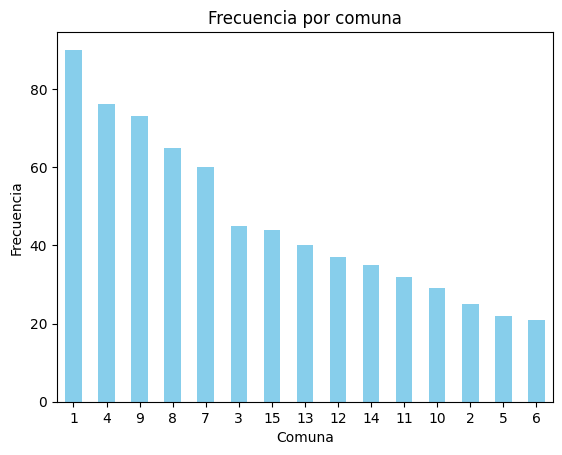

In [47]:
# Representación de la distribución de la frecuencia
frecuencia_comunas.plot(kind='bar', color='skyblue')
plt.title('Frecuencia por comuna')
plt.xlabel('Comuna')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.show()

---->Las comunas 1,4 y 9 son las comunas con mayor frecuencia de accidentes fatales

### COLUMNA: TIPO_DE_CALLE

Según diccionario los valores pueden ser:
- calle: Arteria cuya calzada tiene un ancho comprendido entre cinco (5) y trece (13) metros. Inlcluye pasajes.
- avenida: Arteria cuya calzada tiene un ancho total de por lo menos trece (13) metros.
- autopista: Vía multicarril con calzadas para ambas manos separadas físicamente, sin cruces a nivel, con accesos controlados y sin ingreso directo desde los predios frentistas lindantes. 
- general paz: Avenida General Paz, ambos sentidos. Incluye ingresos y egresos de las mismas, distribuidores y calle colectora.


Se analizan valores nulos o sin datos, valores únicos y distribuciones

In [48]:
# Verificar valores nulos
valores_faltantes = homicidios_hechos['TIPO_DE_CALLE'].isnull().sum()
valores_faltantes

0

----> No existen valores nulos

In [49]:
# Verificar si los valores unicos se corresponden con los del dicc del dataset
valores_unicos = homicidios_hechos['TIPO_DE_CALLE'].unique()
valores_unicos

array(['AVENIDA', 'GRAL PAZ', 'CALLE', 'AUTOPISTA'], dtype=object)

----> Concuerdan con el diccionario, estan ok. Se puede pensar que "general paz" podría recategorizarse a "avenida", pero se entiende que se prefirió tenerlo separado para mejor análisis.

In [50]:
#obtener la distribución de cada tipo de calle
frecuencia_tipos_calle = homicidios_hechos['TIPO_DE_CALLE'].value_counts()
frecuencia_tipos_calle

TIPO_DE_CALLE
AVENIDA      429
CALLE        136
AUTOPISTA     66
GRAL PAZ      65
Name: count, dtype: int64

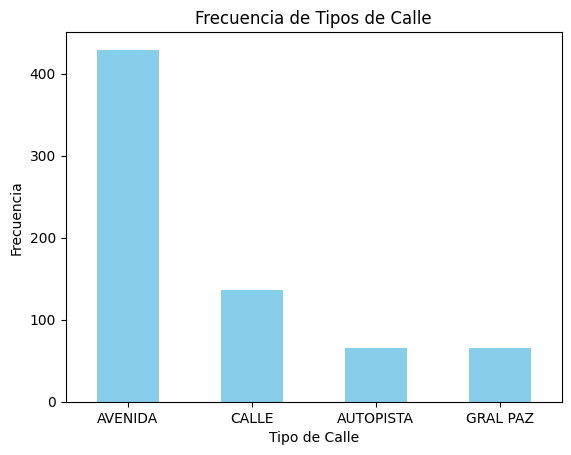

In [51]:
# Representación de la distribución de la frecuencia
frecuencia_tipos_calle.plot(kind='bar', color='skyblue')
plt.title('Frecuencia de Tipos de Calle')
plt.xlabel('Tipo de Calle')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.show()

---->Las avenidas son los tipos de calle con mas frecuencas de accidentes fatales

### COLUMNAS GEOLOCALIZACIÓN: (XY (CABA)	pos x	pos y)

- Columna XY (CABA) : Contiene según diccionario geocodificación plana, por lo que no será utilizada para futuros analisis, se procede con las columnas siguientes para obtener latitud y longitud

- Columna pos x : longitud con separador punto. WGS84
- Columna pos y : latitud con separador punto. WGS84

In [52]:
# Verificar valores nulos en Pos X y Pos Y
nulos_pos_x = homicidios_hechos['pos x'].isnull().sum()
nulos_pos_x

0

----> No hay nulos

In [53]:
nulos_pos_y = homicidios_hechos['pos y'].isnull().sum()
nulos_pos_y

0

---->No hay nulos

Convertir los datos a float para podr armar un mapa de geolocalización

In [54]:
# Convertir las columnas a tipo float
# homicidios_hechos['pos x'] = homicidios_hechos['pos x'].astype(float)
# homicidios_hechos['pos y'] = homicidios_hechos['pos y'].astype(float)
# Al intentar convertir vemos que hay valores no numericos: ValueError: could not convert string to float: '.'

#Reemplazar '.' por nan
homicidios_hechos['pos x'] = homicidios_hechos['pos x'].replace('.', np.nan)
homicidios_hechos['pos y'] = homicidios_hechos['pos y'].replace('.', np.nan)


In [55]:
# Convertir las columnas a tipo float
homicidios_hechos['pos x'] = homicidios_hechos['pos x'].astype(float)
homicidios_hechos['pos y'] = homicidios_hechos['pos y'].astype(float)


# Verificar los tipos de datos
print(homicidios_hechos[['pos x', 'pos y']].dtypes)


pos x    float64
pos y    float64
dtype: object


In [56]:
# Estadísticas descriptivas para Pos X y Pos Y
stats_pos_x = homicidios_hechos['pos x'].describe()
stats_pos_y = homicidios_hechos['pos y'].describe()

print('Estadísticas Pos X:')
print(stats_pos_x)
print('\nEstadísticas Pos Y:')
print(stats_pos_y)

Estadísticas Pos X:
count    684.000000
mean     -58.441545
std        0.046144
min      -58.529942
25%      -58.476218
50%      -58.444513
75%      -58.401841
max      -58.356082
Name: pos x, dtype: float64

Estadísticas Pos Y:
count    684.000000
mean     -34.619632
std        0.035289
min      -34.705250
25%      -34.643689
50%      -34.622928
75%      -34.596799
max      -34.534654
Name: pos y, dtype: float64


----> No se ven outliers comparando minimos y maximos, al ser la misma zona de analisis es correcto a simple vista. (Se profundizará mas adelante con un mapa, para ver si existen localizaciones fuera de la zona)

### COLUMNAS ACTORES: (PARTICIPANTES VICTIMA ACUSADO)


Según diccionario los valores de VICTIMA pueden ser:
- PEATON	Víctima distinta de cualquier ocupante de un vehículo, ya sea un conductor/a o un pasajero/a. Se incluyen los ocupantes o personas que empujan o arrastran un coche de bebé o una silla de ruedas o cualquier otro vehículo sin motor de pequeñas dimensiones. Se incluyen también las personas que caminan empujando una bicicleta o un ciclomotor.	
- MOTO	Vehículo a motor no carrozado que incluye motocicleta, ciclomotor y cuatriciclo.	
- AUTO	Vehículo a motor destinado al transporte de personas, diferente de los motovehículos, y que tenga hasta nueve plazas (incluyendo al asiento del conductor) (Sedan, SUV, coupe, etc)	
- CARGAS	Vehículo a motor destiando al transporte de cargas, incluye camiones pesados (con o sin acoplado o semirremolque, etc., camión de recolección de residuos) y livianos (utilitarios, furgonetas, pick-ups, camioneta con caja de carga).	
- BICICLETA	Vehículo con al menos dos ruedas, que generalmente es accionado por el esfuerzo muscular de las personas que lo ocupan, en particular mediante pedales o manivelas. Incluye bicicletas de pedaleo asistido y/o con motor	
- PASAJEROS	Personas lesionadas que se encuentran dentro, descendiendo o ascendiendo de las unidades de autotrasporte público de pasajeros/as y ómnibus de larga distancia	
- MOVIL	Vehículos de emergencia: móviles policiales, ambulancias, autobombas. 	
- OTRO	otros vehiculos	
- SD	Sin datos sobre el tipo de víctima	



Según diccionario los valores de ACUSADO pueden ser:
- AUTO	Vehículo a motor destinado al transporte de personas, diferente de los motovehículos, y que tenga hasta nueve plazas (incluyendo al asiento del conductor) (Sedan, SUV, coupe, etc)
- BICICLETA	Vehículo con al menos dos ruedas, que generalmente es accionado por el esfuerzo muscular de las personas que lo ocupan, en particular mediante pedales o manivelas. Incluye bicicletas de pedaleo asistido y/o con motor
- CARGAS	Vehículo a motor destiando al transporte de cargas, incluye camiones pesados (con o sin acoplado o semirremolque, etc., camión de recolección de residuos) y livianos (utilitarios, furgonetas, pick-ups, camioneta con caja de carga).
- MOTO	Vehículo a motor no carrozado que incluye motocicleta, ciclomotor y cuatriciclo.
- OBJETO FIJO	Colisión contra objetos inmóviles fijados de manera permanente o semipermanente (columna, árbol, semáforo, etc.) o pérdidas de equilibrio de vehículos de dos ruedas que desencadenen la caída de sus ocupantes.
- PASAJEROS	Personas lesionadas que se encuentran dentro, descendiendo o ascendiendo de las unidades de autotrasporte público de pasajeros/as y ómnibus de larga distancia
- TREN	Equipo móvil que se desplaza exclusivamente sobre rieles
- OTRO	otros vehiculos
- SD	Sin datos sobre el vehículo participante




Según diccionario los valores de PARTICIPANTES pueden ser:
- MULTIPLE cuando participan más de un vehículo como contraparte de la víctima.

Se analizan valores nulos o sin datos, valores únicos y distribuciones

In [57]:
# Verificar valores nulos
valores_faltantes = homicidios_hechos['PARTICIPANTES'].isnull().sum() # No existen valores nulos
valores_faltantes = homicidios_hechos['VICTIMA'].isnull().sum() # No existen valores nulos
valores_faltantes = homicidios_hechos['ACUSADO'].isnull().sum() # No existen valores nulos

---->No existen valores nulos

* VICTIMAS:

In [185]:
# Verificar si los valores unicos se corresponden con los del dicc del dataset
valores_unicos_victimas = homicidios_hechos['VICTIMA'].unique()
valores_unicos_victimas

array(['MOTO', 'AUTO', 'PEATON', 'SD', 'CARGAS', 'BICICLETA', 'PASAJEROS',
       'MOVIL', 'OBJETO FIJO', 'PEATON_MOTO'], dtype=object)

---->Agrega el valor "PEATON_MOTO", "OBJETO FIJO" que no se encuentran en diccionario.

Se revisa OBJETO FIJO presuponiendo que puede ser un error

In [58]:
filas_objeto_fijo = homicidios_hechos[homicidios_hechos['VICTIMA'] == 'OBJETO FIJO']
filas_objeto_fijo

,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO,FECHA_combinada,Fecha_coincide,DIA_SEMANA,Esquina
230,2017-0108,2,2017-09-02,2017,9,2,04:53:08,4.0,AV. GRAL. PAZ Y MACHAIN,GRAL PAZ,...,Point (97098.48468623 109019.96106626),-58.494911,-34.547956,AUTO-OBJETO FIJO,OBJETO FIJO,AUTO,2017-09-02,True,6. Sabado,True


In [59]:
#Revisamos el dataset victimas con ese mismo ID
Victimas_objeto_fijo = homicidios_victimas[homicidios_victimas['ID_hecho'] == '2017-0108']
Victimas_objeto_fijo

,ID_hecho,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,FECHA_FALLECIMIENTO
237,2017-0108,2017-09-02,2017,9,2,PASAJERO_ACOMPAÑANTE,AUTO,MASCULINO,17,2017-09-02 00:00:00
238,2017-0108,2017-09-02,2017,9,2,PASAJERO_ACOMPAÑANTE,AUTO,MASCULINO,10,2017-09-02 00:00:00


---->Se corrobora que la victima es el auto y no el objeto fijo, por lo que se procede a invertir el dato tanto en acusado, victima y participante:

In [60]:
# Actualizar las filas donde ID sea 2017-0108
homicidios_hechos.loc[homicidios_hechos['ID'] == '2017-0108', 'VICTIMA'] = 'AUTO'
homicidios_hechos.loc[homicidios_hechos['ID'] == '2017-0108', 'ACUSADO'] = 'OBJETO FIJO'
homicidios_hechos.loc[homicidios_hechos['ID'] == '2017-0108', 'PARTICIPANTES'] = 'OBJETO FIJO-AUTO'

* Acusado

In [61]:
# Verificar si los valores unicos se corresponden con los del dicc del dataset
valores_unicos_acusado = homicidios_hechos['ACUSADO'].unique()
valores_unicos_acusado

array(['AUTO', 'PASAJEROS', 'SD', 'OBJETO FIJO', 'CARGAS', 'MOTO',
       'MULTIPLE', 'OTRO', 'BICICLETA', 'TREN'], dtype=object)

----> Agrega el valor "MULTIPLE" que no se encuentra en diccionario.

Se busca información sobre la categoría "PASAJERO":
- Segun el diccionario: Personas lesionadas que se encuentran dentro, descendiendo o ascendiendo de las unidades de autotrasporte público de pasajeros/as y ómnibus de larga distancia
- Segun link adjunto de la web https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte-y-obras-publicas/victimas-siniestros-viales/NOTAS_SINIESTROS_VIALES_2019-2023.pdf: 
    
    TRANSPORTE PUBLICO: 
    * Como víctima: Personas lesionadas que se encuentran dentro, descendiendo o ascendiendo de las unidades de autotrasporte público de pasajeros/as. 
    * Como acusado: contraparte: vehículos de autotransporte público de pasajeros/as

Se procede a cambiar dentro de acusado "PASAJEROS" por "TANSPORTE_PUBLICO"

In [62]:
homicidios_hechos['ACUSADO'] = homicidios_hechos['ACUSADO'].replace('PASAJEROS', 'TRANSPORTE_PUBLICO')

En consecuencia se procede a cambiar también dentro de participantes "PASAJEROS" por "TANSPORTE_PUBLICO"

In [63]:
#Se modifican todas las combinaciones
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('AUTO-PASAJEROS', 'AUTO-TRANSPORTE_PUBLICO')
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('BICICLETA-PASAJEROS', 'BICICLETA-TRANSPORTE_PUBLICO')
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('MOTO-PASAJEROS', 'MOTO-TRANSPORTE_PUBLICO')
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('PEATON-PASAJEROS', 'PEATON-TRANSPORTE_PUBLICO')
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('CARGAS-PASAJEROS', 'CARGAS-TRANSPORTE_PUBLICO')
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('MOVIL-PASAJEROS', 'MOVIL-TRANSPORTE_PUBLICO')
homicidios_hechos['PARTICIPANTES'] = homicidios_hechos['PARTICIPANTES'].replace('PASAJEROS-PASAJEROS', 'PASAJEROS-TRANSPORTE_PUBLICO')

In [64]:
# Obtener la distribución de cada tipo de Victima
frecuencia_victima = homicidios_hechos['VICTIMA'].value_counts()
print(frecuencia_victima)

#Obtener la distribución de cada tipo de Acusado
frecuencia_acusado = homicidios_hechos['ACUSADO'].value_counts()
print(frecuencia_acusado)

VICTIMA
MOTO           295
PEATON         264
AUTO            84
BICICLETA       29
SD               9
CARGAS           7
PASAJEROS        5
MOVIL            2
PEATON_MOTO      1
Name: count, dtype: int64
ACUSADO
AUTO                  203
TRANSPORTE_PUBLICO    173
CARGAS                146
OBJETO FIJO            63
MOTO                   57
SD                     23
MULTIPLE               17
BICICLETA               7
OTRO                    6
TREN                    1
Name: count, dtype: int64


Se realiza un gráfico con dos subgraficos, comparando la distribución por acusado y por victima 

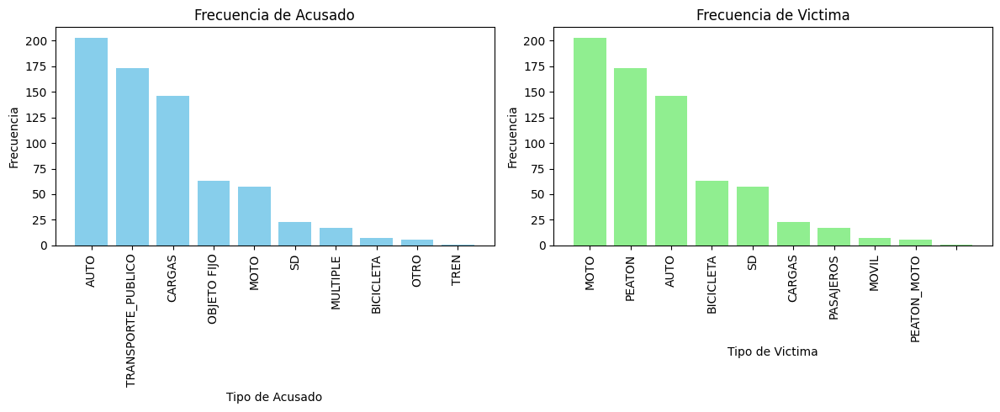

In [67]:
# Se crea una figura y ejes para dos subgráficas
fig, ax = plt.subplots(1, 2, figsize=(12, 5))  # 1 fila, 2 columnas

# Frecuencia de Acusado
ax[0].bar(frecuencia_acusado.index, frecuencia_acusado.values, color='skyblue')
ax[0].set_title('Frecuencia de Acusado')
ax[0].set_xlabel('Tipo de Acusado')
ax[0].set_ylabel('Frecuencia')
ax[0].set_xticklabels(frecuencia_acusado.index, rotation=90)

#  Frecuencia de Acusado 
ax[1].bar(frecuencia_acusado.index, frecuencia_acusado.values, color='lightgreen')
ax[1].set_title('Frecuencia de Victima')
ax[1].set_xlabel('Tipo de Victima')
ax[1].set_ylabel('Frecuencia')
ax[1].set_xticklabels(frecuencia_victima.index, rotation=90)

plt.tight_layout()
plt.show()



----> Se Observa que por el lado de los ACUSADOS, Auto y Transporte público son los mas frecuentes. Mientras que Moto y Peatón son los más frencuentes respecto a VICTIMAS 

In [68]:
# Verificar si los valores unicos se corresponden con los del dicc del dataset
valores_unicos_participantes = homicidios_hechos['PARTICIPANTES'].unique()
valores_unicos_participantes


array(['MOTO-AUTO', 'AUTO-TRANSPORTE_PUBLICO', 'MOTO-SD',
       'MOTO-TRANSPORTE_PUBLICO', 'MOTO-OBJETO FIJO', 'MOTO-CARGAS',
       'PEATON-AUTO', 'PEATON-MOTO', 'PEATON-TRANSPORTE_PUBLICO',
       'AUTO-AUTO', 'AUTO-OBJETO FIJO', 'PEATON-CARGAS', 'MOTO-MOTO',
       'MULTIPLE', 'SD-SD', 'AUTO-CARGAS', 'AUTO-SD', 'MOTO-MOVIL',
       'CARGAS-CARGAS', 'PEATON-SD', 'BICICLETA-CARGAS', 'SD-CARGAS',
       'BICICLETA-TRANSPORTE_PUBLICO', 'PASAJEROS-TRANSPORTE_PUBLICO',
       'MOVIL-TRANSPORTE_PUBLICO', 'CARGAS-OBJETO FIJO',
       'PEATON-BICICLETA', 'SD-AUTO', 'CARGAS-AUTO', 'BICICLETA-AUTO',
       'OBJETO FIJO-AUTO', 'MOTO-BICICLETA', 'SD-MOTO', 'MOVIL-CARGAS',
       'PASAJEROS-AUTO', 'AUTO-MOVIL', 'CARGAS-TRANSPORTE_PUBLICO',
       'BICICLETA-TREN', 'BICICLETA-OTRO', 'MOTO-OTRO',
       'PEATON_MOTO-MOTO', 'PASAJEROS-SD'], dtype=object)

### Normalización de nombres y exportación archivos POST EDA-ETL

Para una mejor presentación se reorganizan y se renombran algunas columnas.

In [69]:
homicidios_hechos.columns

Index(['ID', 'N_VICTIMAS', 'FECHA', 'AAAA', 'MM', 'DD', 'HORA', 'HH',
       'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'Calle', 'Altura', 'Cruce',
       'Dirección Normalizada', 'COMUNA', 'XY (CABA)', 'pos x', 'pos y',
       'PARTICIPANTES', 'VICTIMA', 'ACUSADO', 'FECHA_combinada',
       'Fecha_coincide', 'DIA_SEMANA', 'Esquina'],
      dtype='object')

In [70]:
# Renombrar columnas
homicidios_hechos.rename(columns={
    'ID': 'ID_HECHO',
    'Calle': 'CALLE',
    'Altura': 'ALTURA',
    'Cruce': 'CRUCE',
    'Dirección Normalizada': 'DIRECCION_NORMALIZADA',
    'pos x': 'LONGITUD',
    'pos y': 'LATITUD',
    'Esquina': 'ESQUINA'
}, inplace=True)

In [71]:
# Eliminar columnas
homicidios_hechos.drop(columns=['FECHA_combinada', 'Fecha_coincide'], inplace=True)

In [72]:
#Reordenamiento de las columnas: DIA DE SEMANA
# Obtener el orden actual de las columnas
columnas = list(homicidios_hechos.columns)

# Si 'DIA_SEMANA' ya está en el DataFrame, eliminarla de la lista de columnas
if 'DIA_SEMANA' in columnas:
    columnas.remove('DIA_SEMANA')

# Reordenar las columnas moviendo 'DIA_SEMANA' después de 'HH'
nueva_orden = (
    columnas[:columnas.index('HH') + 1] +  # Columnas hasta 'HH'
    ['DIA_SEMANA'] +                      # Insertar 'DIA_SEMANA' después de 'HH'
    columnas[columnas.index('HH') + 1:]   # Columnas después de 'HH'
)

# Reasignar el DataFrame con el nuevo orden de columnas
homicidios_hechos = homicidios_hechos[nueva_orden]



In [73]:
# Obtener el orden actual de las columnas
columnas = list(homicidios_hechos.columns)

# Si 'ESQUINA' ya está en el DataFrame, eliminarla de la lista de columnas
if 'ESQUINA' in columnas:
    columnas.remove('ESQUINA')

# Reordenar las columnas moviendo 'ESQUINA' después de 'DIRECCION_NORMALIZADA'
nueva_orden = (
    columnas[:columnas.index('DIRECCION_NORMALIZADA') + 1] +  # Columnas hasta 'DIRECCION_NORMALIZADA'
    ['ESQUINA'] +  # Insertar 'ESQUINA' después de 'DIRECCION_NORMALIZADA'
    columnas[columnas.index('DIRECCION_NORMALIZADA') + 1:]  # Columnas después de 'DIRECCION_NORMALIZADA'
)

# Reindexar el DataFrame con el nuevo orden de columnas
homicidios_hechos = homicidios_hechos[nueva_orden]


In [202]:
homicidios_hechos.columns

Index(['ID_HECHO', 'N_VICTIMAS', 'FECHA', 'AAAA', 'MM', 'DD', 'HORA', 'HH',
       'DIA_SEMANA', 'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'CALLE', 'ALTURA',
       'CRUCE', 'DIRECCION_NORMALIZADA', 'ESQUINA', 'COMUNA', 'XY (CABA)',
       'LONGITUD', 'LATITUD', 'PARTICIPANTES', 'VICTIMA', 'ACUSADO'],
      dtype='object')

In [203]:
# Exportar a Excel
homicidios_hechos.to_excel("Homicidios POST EDA-ETL.xlsx", index=False)

 ---
# ***VICTIMAS***
---

## 6- Análisis preliminares y generales (VICTIMAS)

Se obtiene información general y se revisa si hay valores nulos y faltantes

In [74]:
homicidios_victimas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID_hecho             717 non-null    object        
 1   FECHA                717 non-null    datetime64[ns]
 2   AAAA                 717 non-null    int64         
 3   MM                   717 non-null    int64         
 4   DD                   717 non-null    int64         
 5   ROL                  717 non-null    object        
 6   VICTIMA              717 non-null    object        
 7   SEXO                 717 non-null    object        
 8   EDAD                 717 non-null    object        
 9   FECHA_FALLECIMIENTO  717 non-null    object        
dtypes: datetime64[ns](1), int64(3), object(6)
memory usage: 56.1+ KB


In [76]:
#Detectar cantidad exacta de nulos
homicidios_victimas.isnull().sum()

ID_hecho               0
FECHA                  0
AAAA                   0
MM                     0
DD                     0
ROL                    0
VICTIMA                0
SEXO                   0
EDAD                   0
FECHA_FALLECIMIENTO    0
dtype: int64

---->No se detectan nulos

Se crea un informe de análisis exploratorio de datos (EDA) usando ProfileReport de la librería ydata_profiling (anteriormente conocida como pandas_profiling).

In [77]:
#genera un informe completo basado en el DataFrame
profile_victimas = ProfileReport(homicidios_victimas, title="EDA de Victimas", explorative=True)

# muestra ese informe en un Jupyter Notebook como un iframe, permitiendo la interacción y exploración dentro del entorno de trabajo
profile_victimas.to_notebook_iframe() 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [312]:
# Guarrdar Reporte General de Hechos
profile.to_file('..\\3. Reportes Profiling\\' + "Reporte_Profile_VICTIMAS_1.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]


Analisis de duplicados:

In [78]:
# Detectar filas duplicadas en todas las columnas
duplicadas = homicidios_victimas.duplicated(keep=False)

# Mostrar solo las filas duplicadas
filas_duplicadas = homicidios_victimas[duplicadas]
filas_duplicadas

,ID_hecho,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,FECHA_FALLECIMIENTO


---->Se corrobora que no hay filas duplicadas.

## 7- Análisis Univariables (VICTIMAS)

Detalle resumido de las columnas del DataSet
***Variable*** | ***Tipo de dato***| ***Descripción*** 
--- | ---| --- 
ID_hecho | object  | identificador unico del siniestro
FECHA | datetime64 | fecha en formato dd/mm/aaaa
AAAA | int64  | año
MM | int64  | mes
DD | int64  | día del mes
ROL | object  | Posición relativa al vehículo que presentaba la víctima en el momento del siniestro
VICTIMA | object  | Vehículo que ocupaba quien haya fallecido a se haya lastimado a raíz del hecho, o bien peatón/a.
SEXO | object  | Sexo informado por fuente policial de la víctima
EDAD | object  | Edad de la víctima al momento del siniestro
FECHA_FALLECIMIENTO | object  | Fecha de fallecimiento de la víctima



### COLUMNA: ID

Si bien se detectó que no existen filas duplicadas se analiza que si todos los ID son valores únicos, no existan duplicados ni nulos

In [80]:
# Mostrar los Ids duplicados
duplicados = homicidios_victimas[homicidios_victimas.duplicated(subset='ID_hecho', keep=False)]
duplicados.head()

,ID_hecho,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,FECHA_FALLECIMIENTO
29,2016-0041,2016-03-29,2016,3,29,CONDUCTOR,MOTO,MASCULINO,54,2016-03-29 00:00:00
30,2016-0041,2016-03-29,2016,3,29,PASAJERO_ACOMPAÑANTE,MOTO,MASCULINO,SD,2016-03-30 00:00:00
98,2016-0126,2016-09-18,2016,9,18,CONDUCTOR,AUTO,MASCULINO,37,SD
99,2016-0126,2016-09-18,2016,9,18,PASAJERO_ACOMPAÑANTE,AUTO,MASCULINO,60,SD
163,2017-0026,2017-02-26,2017,2,26,PASAJERO_ACOMPAÑANTE,AUTO,FEMENINO,23,2017-02-26 00:00:00


---->Se entiende que todos los ID duplicados considerando que hay mas de una victima por hecho

In [81]:
# Mostrar los Ids nulos
nulos_id = homicidios_victimas['ID_hecho'].isnull().sum()
nulos_id

0

---->No existen nulos

In [82]:
# Contar cuántos valores son iguales a "S/D" en la columna 'Id'
valores_sd = (homicidios_victimas['ID_hecho'] == "SD").sum()
valores_sd

0

---->No existen valores S/D

In [211]:
#Convertir a string para un mejor manejo del dato 
homicidios_victimas['ID_hecho'] = homicidios_victimas['ID_hecho'].astype(str)

### COLUMNAS FECHA: (FECHA AAAA MM DD)

FECHA: Se analiza tipos de dato, estadísticas y nulos

In [83]:
# Comprobar el tipo de dato FECHA
print(homicidios_victimas['FECHA'].dtype)

datetime64[ns]


In [84]:
# Estadísticas descriptivas FECHA
estadísticas = homicidios_victimas['FECHA'].describe()
estadísticas

count                              717
mean     2018-09-09 01:36:24.100418304
min                2016-01-01 00:00:00
25%                2017-04-01 00:00:00
50%                2018-07-07 00:00:00
75%                2019-12-18 00:00:00
max                2021-12-30 00:00:00
Name: FECHA, dtype: object

---->Las fechas van desde 01-01-2016 a 30-12-2021

In [85]:
# Contar valores nulos FECHA
nulos_fecha = homicidios_victimas['FECHA'].isnull().sum()
nulos_fecha

0

In [86]:
# Contar cuántos valores son iguales a "S/D" en la columna 'Fecha'
valores_sd = (homicidios_victimas['FECHA'] == "SD").sum()
valores_sd

0

---->No existen valores nulos ni S/D

AAAA: Se analiza tipos de dato, estadísticas y nulos

In [87]:
# Comprobar el tipo de dato AAAA
print(homicidios_victimas['AAAA'].dtype)

int64


In [88]:
# # Estadísticas descriptivas AAAA
estadísticas = homicidios_victimas['AAAA'].describe()
estadísticas

count     717.000000
mean     2018.174338
std         1.672655
min      2016.000000
25%      2017.000000
50%      2018.000000
75%      2019.000000
max      2021.000000
Name: AAAA, dtype: float64

---->Los años van desde 2016 a 2021

In [89]:
# Contar valores nulos AAAA
nulos_aaaa = homicidios_victimas['AAAA'].isnull().sum()
nulos_aaaa

0

---->No existen valores nulos.

MM: Se analiza tipos de dato, estadísticas y nulos

In [90]:
# Comprobar el tipo de dato MM
print(homicidios_victimas['MM'].dtype)

int64


In [91]:
# Estadísticas descriptivas MM
estadísticas = homicidios_victimas['MM'].describe()
estadísticas

count    717.000000
mean       6.688982
std        3.575140
min        1.000000
25%        4.000000
50%        7.000000
75%       10.000000
max       12.000000
Name: MM, dtype: float64

In [92]:
# Contar valores nulos MM
nulos_mm = homicidios_victimas['MM'].isnull().sum()
nulos_mm

0

---->No existen valores nulos.

DD: Se analiza tipos de dato, estadísticas y nulos

In [222]:
# Comprobar el tipo de dato DD
print(homicidios_victimas['DD'].dtype)

int64


In [223]:
# Estadísticas descriptivas DD
estadísticas = homicidios_victimas['DD'].describe()
estadísticas

count    717.000000
mean      15.960948
std        8.683358
min        1.000000
25%        9.000000
50%       16.000000
75%       23.000000
max       31.000000
Name: DD, dtype: float64

In [224]:
# Contar valores nulos DD
nulos_dd = homicidios_victimas['DD'].isnull().sum()
nulos_dd

0

---->No existen valores nulos.

Se compara que la columna "FECHA" sea coincidente con la combinacion de "AAAA+MM+DD" para detectar posibles errores

In [93]:
# Crear una nueva columna con la fecha formada por AAAA, MM y DD
homicidios_victimas['FECHA_combinada'] = pd.to_datetime(
    homicidios_victimas['AAAA'].astype(str) + '-' +
    homicidios_victimas['MM'].astype(str).str.zfill(2) + '-' +
    homicidios_victimas['DD'].astype(str).str.zfill(2),
    format='%Y-%m-%d'  # Formato correcto: AAAA-MM-DD
)
# Comparar las fechas
homicidios_victimas['Fecha_coincide'] = homicidios_victimas['FECHA'] == homicidios_victimas['FECHA_combinada']

# Mostrar las filas donde las fechas no coinciden
discrepancias = homicidios_victimas[homicidios_victimas['Fecha_coincide'] == False]
discrepancias

,ID_hecho,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,FECHA_FALLECIMIENTO,FECHA_combinada,Fecha_coincide


--->No hay errores en las fechas, es coincidente la columna FECHA con con la fecha formada por AAAA, MM y DD

### COLUMNA: ROL

Se analizan valores nulos o sin datos, valores únicos y distribuciones

In [94]:
# Verificar valores nulos
valores_faltantes = homicidios_victimas['ROL'].isnull().sum()
valores_faltantes

0

---->No existen valores nulos

In [95]:
# Verificar si los valores unicos 
valores_unicos = homicidios_victimas['ROL'].unique()
valores_unicos


array(['CONDUCTOR', 'PASAJERO_ACOMPAÑANTE', 'PEATON', 'SD', 'CICLISTA'],
      dtype=object)

In [96]:
#obtener la distribución de cada tipo de calle
frecuencia_rol = homicidios_victimas['ROL'].value_counts()
frecuencia_rol


ROL
CONDUCTOR               330
PEATON                  267
PASAJERO_ACOMPAÑANTE     80
CICLISTA                 29
SD                       11
Name: count, dtype: int64

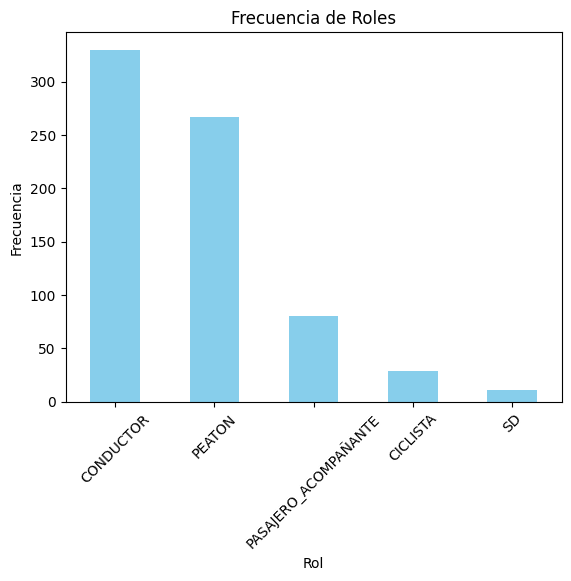

In [97]:
# Representación de la distribución de la frecuencia
frecuencia_rol.plot(kind='bar', color='skyblue')
plt.title('Frecuencia de Roles')
plt.xlabel('Rol')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.show()

---->El rol que tiene mayor  frecuencias de victima es el CONDUCTOR

### COLUMNA: SEXO

Se analizan valores nulos o sin datos, valores únicos y distribuciones

In [98]:
# Verificar valores nulos
valores_faltantes = homicidios_victimas['SEXO'].isnull().sum()
valores_faltantes

0

----> No existen valores nulos

In [99]:
# Verificar si los valores unicos 
valores_unicos = homicidios_victimas['SEXO'].unique()
valores_unicos


array(['MASCULINO', 'FEMENINO', 'SD'], dtype=object)

Se analiza la distribución de los datos entre ambos sexos y la proporción de cada uno de ellos mediante un gráfico de torta

In [100]:
#obtener la distribución de cada tipo de calle
frecuencia_sexo = homicidios_victimas['SEXO'].value_counts()
frecuencia_sexo


SEXO
MASCULINO    545
FEMENINO     166
SD             6
Name: count, dtype: int64

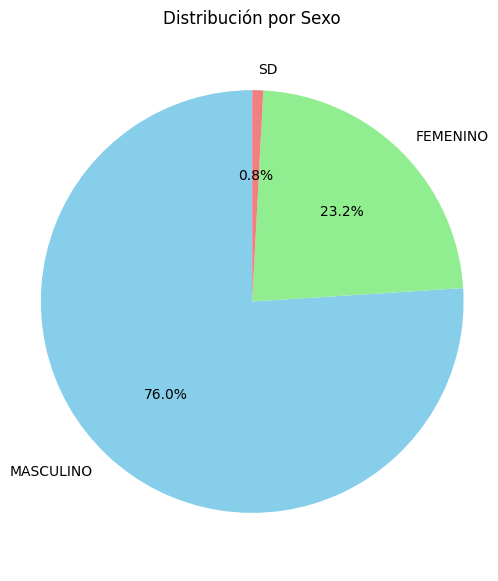

In [101]:
# Representación de la distribución de la frecuencia
# Crear un gráfico de torta
plt.figure(figsize=(6,7))
plt.pie(frecuencia_sexo, labels=frecuencia_sexo.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribución por Sexo')
plt.axis('equal')  # Para que el gráfico de torta sea un círculo
plt.show()

---->Se obserba como mas del 76% de las victimas son hombres.

### COLUMNA: EDAD

Se analizan valores nulos o sin datos, valores únicos, formato y distribuciones

In [103]:
# Verificar valores nulos
valores_faltantes = homicidios_victimas['EDAD'].isnull().sum()
valores_faltantes

0

---->No existen valores nulos

In [104]:
# Verificar  los valores unicos 
valores_unicos = homicidios_victimas['EDAD'].unique()

# Convertir a enteros, eliminando posibles valores no numéricos o nulos
valores_unicos = pd.to_numeric(valores_unicos, errors='coerce')

# Ordenar los valores únicos
valores_unicos = np.sort(valores_unicos)
valores_unicos

array([ 1.,  4.,  5.,  7., 10., 11., 12., 13., 15., 16., 17., 18., 19.,
       20., 21., 22., 23., 24., 25., 26., 27., 28., 29., 30., 31., 32.,
       33., 34., 35., 36., 37., 38., 39., 40., 41., 42., 43., 44., 45.,
       46., 47., 48., 49., 50., 51., 52., 53., 54., 55., 56., 57., 58.,
       59., 60., 61., 62., 63., 64., 65., 66., 67., 68., 69., 70., 71.,
       72., 73., 74., 75., 76., 77., 78., 79., 80., 81., 82., 83., 84.,
       85., 86., 87., 88., 91., 92., 95., nan])

---->Se observan que las victimas van desde 1 año hasta 95

In [105]:
#obtener la distribución de las edades
frecuencia_edad = homicidios_victimas['EDAD'].value_counts()
frecuencia_edad

EDAD
SD    53
30    28
29    24
23    24
27    20
      ..
11     1
13     1
85     1
7      1
88     1
Name: count, Length: 86, dtype: int64

Se busca ver la densidad de probabilidad de la distribución de edades

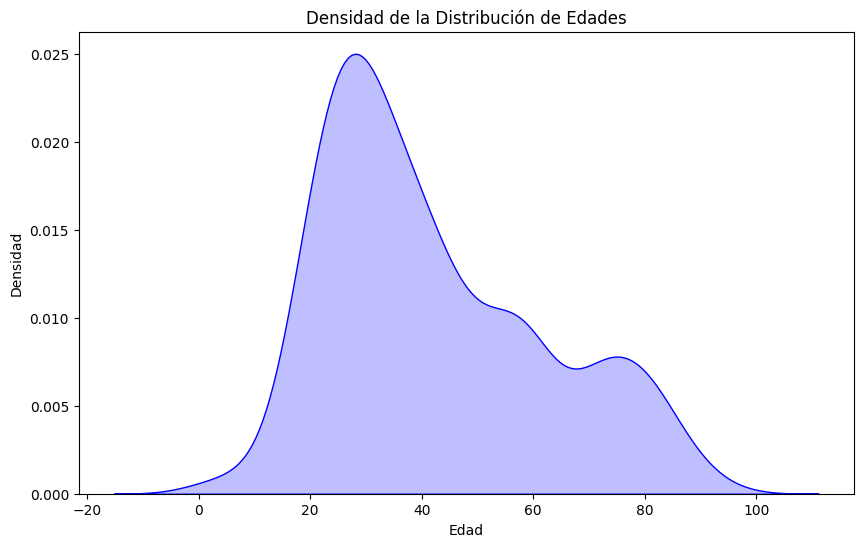

In [107]:
# Representación de la distribución de la frecuencia
# Filtrar las filas donde 'EDAD' es "SD"
homicidios_victimas_filtrado = homicidios_victimas[homicidios_victimas['EDAD'] != "SD"]

plt.figure(figsize=(10, 6))
sns.kdeplot(homicidios_victimas_filtrado['EDAD'], fill=True, color='blue')
plt.title('Densidad de la Distribución de Edades')
plt.xlabel('Edad')
plt.ylabel('Densidad')
plt.show()


---->Se observa como la mayor cantidad de victimas se concentran entre los 20 y 40 años.

Se considera conveniente crear una nueva columna con "RANGO_ETARIO" para simplificar el análisis ante tantas variables numéricas dentro de edades

In [108]:
# Definir los rangos de edad
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 100]
labels = ['Menor o igual a 10 años', 'Entre 11 y 20 años', 'Entre 21 y 30 años', 'Entre 31 y 40 años', 
          'Entre 41 y 50 años', 'Entre 51 y 60 años', 'Entre 61 y 70 años', 'Entre 71 y 80 años', 'Mayor a 80 años']

# Crear la nueva columna "RANGO_ETARIO"
homicidios_victimas['RANGO_ETARIO'] = pd.cut(homicidios_victimas_filtrado['EDAD'], bins=bins, labels=labels, right=True)


# Ver los primeros resultados
homicidios_victimas[['EDAD', 'RANGO_ETARIO']].head()


,EDAD,RANGO_ETARIO
0,19,Entre 11 y 20 años
1,70,Entre 61 y 70 años
2,30,Entre 21 y 30 años
3,18,Entre 11 y 20 años
4,29,Entre 21 y 30 años


Se calcula la frecuencia y se ve reflejada en un Histograma

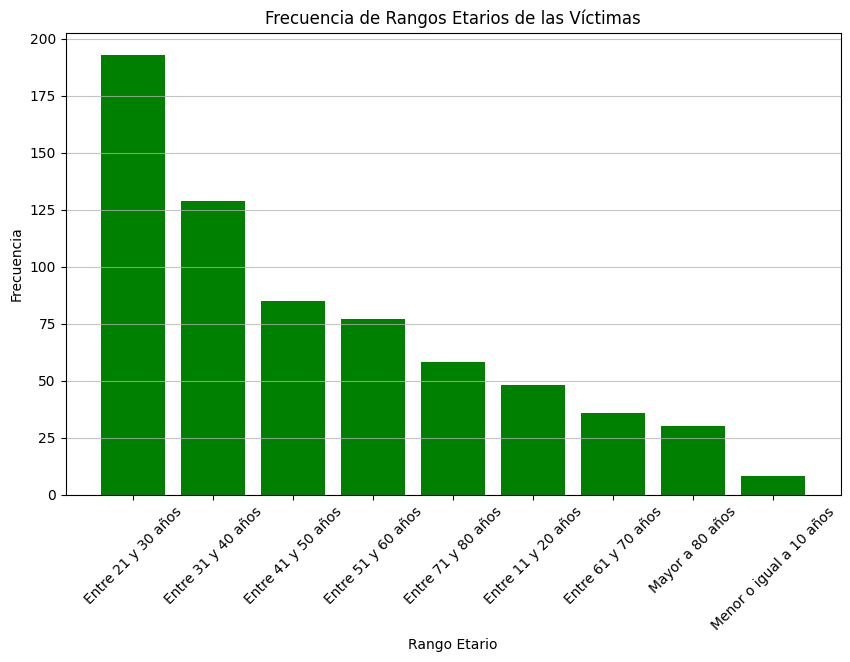

In [110]:
# Calcular la frecuencia de cada rango etario
frecuencia_rango_etario = homicidios_victimas['RANGO_ETARIO'].value_counts()

# Crear un gráfico de barras para la frecuencia de rangos etarios
plt.figure(figsize=(10, 6))
plt.bar(frecuencia_rango_etario.index, frecuencia_rango_etario.values, color='green')
plt.title('Frecuencia de Rangos Etarios de las Víctimas')
plt.xlabel('Rango Etario')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

---->Ampliamente la franja etaria que va desde los 21 a los 30 años es la más afectada por esta problemática


### COLUMNA: VICTIMA

Según diccionario los valores pueden ser:
- PEATON	Víctima distinta de cualquier ocupante de un vehículo, ya sea un conductor/a o un pasajero/a. Se incluyen los ocupantes o personas que empujan o arrastran un coche de bebé o una silla de ruedas o cualquier otro vehículo sin motor de pequeñas dimensiones. Se incluyen también las personas que caminan empujando una bicicleta o un ciclomotor.
- MOTO	Vehículo a motor no carrozado que incluye motocicleta, ciclomotor y cuatriciclo.
- AUTO	Vehículo a motor destinado al transporte de personas, diferente de los motovehículos, y que tenga hasta nueve plazas (incluyendo al asiento del conductor) (Sedan, SUV, coupe, etc)
- CARGAS	Vehículo a motor destiando al transporte de cargas, incluye camiones pesados (con o sin acoplado o semirremolque, etc., camión de recolección de residuos) y livianos (utilitarios, furgonetas, pick-ups, camioneta con caja de carga).
- BICICLETA	Vehículo con al menos dos ruedas, que generalmente es accionado por el esfuerzo muscular de las personas que lo ocupan, en particular mediante pedales o manivelas. Incluye bicicletas de pedaleo asistido y/o con motor
- PASAJEROS	Personas lesionadas que se encuentran dentro, descendiendo o ascendiendo de las unidades de autotrasporte público de pasajeros/as y ómnibus de larga distancia
- MOVIL	Vehículos de emergencia: móviles policiales, ambulancias, autobombas. 
- OTRO	otros vehiculos
- SD	Sin datos sobre el tipo de víctima



In [111]:
# Verificar valores nulos
valores_faltantes = homicidios_victimas['VICTIMA'].isnull().sum()
valores_faltantes

0

----> No existen valores nulos

In [112]:
# Verificar si los valores unicos se corresponden con los del dicc del dataset
valores_unicos_victima = homicidios_victimas['VICTIMA'].unique()
valores_unicos_victima

array(['MOTO', 'AUTO', 'PEATON', 'SD', 'CARGAS', 'BICICLETA', 'PASAJEROS',
       'MOVIL'], dtype=object)

----> Todos se corresponde con el diccionario del datasat. No hay valores fuera de lo establecido

Se calcula la frecuencia por tipo de víctima y se gráfica para una mejor visualización

In [114]:
#Obtener la distribución de cada tipo de Victima
frecuencia_victima =homicidios_victimas['VICTIMA'].value_counts()
print(frecuencia_victima)


VICTIMA
MOTO         303
PEATON       267
AUTO          94
BICICLETA     29
SD             9
CARGAS         7
PASAJEROS      5
MOVIL          3
Name: count, dtype: int64


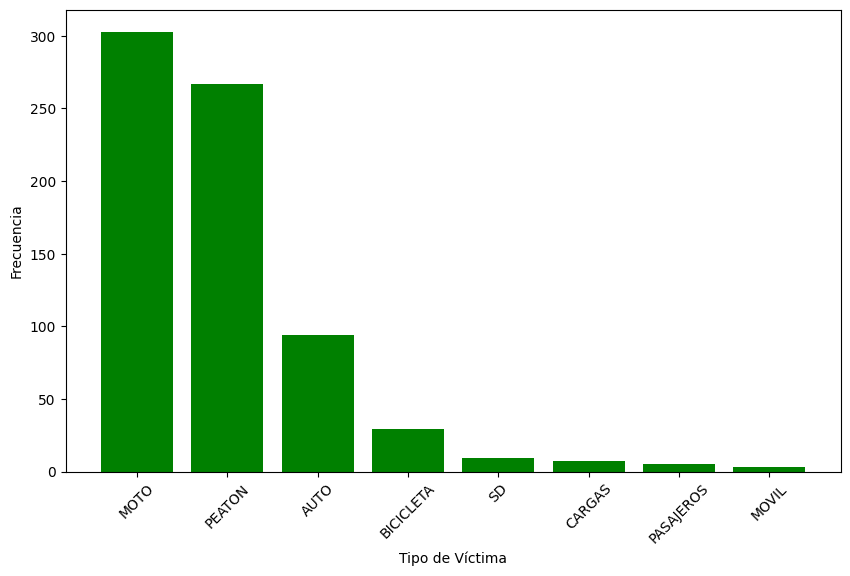

In [115]:
# Crear un gráfico de barras para la distribución de tipos de víctima
plt.figure(figsize=(10, 6))
plt.bar(frecuencia_victima.index, frecuencia_victima.values, color='green')  
plt.xlabel('Tipo de Víctima')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.show()

----> Peatones y Motos son las categorías con más victimas fatales.

### COLUMNA: FECHA FALLECIMIENTO

In [117]:
# Verificar valores nulos
valores_faltantes = homicidios_victimas['FECHA_FALLECIMIENTO'].isnull().sum()
valores_faltantes

0

---->No existen valores nulos

Se considera prudente agregar una columna nueva que calcule la diferencia en días entre la fecha del accidente y la fecha de fallecimiento

In [119]:
# Filtrar las filas donde 'FECHA' y 'FECHA_FALLECIMIENTO' no sean "SD"
homicidios_victimas_filtrado = homicidios_victimas[
    (homicidios_victimas['FECHA'] != "SD") & 
    (homicidios_victimas['FECHA_FALLECIMIENTO'] != "SD")
].copy()  # Utiliza .copy() para evitar SettingWithCopyWarning

# Asegurarse de que las columnas son del tipo datetime
homicidios_victimas_filtrado['FECHA'] = pd.to_datetime(homicidios_victimas_filtrado['FECHA'])
homicidios_victimas_filtrado['FECHA_FALLECIMIENTO'] = pd.to_datetime(homicidios_victimas_filtrado['FECHA_FALLECIMIENTO'])

# Calcular la diferencia en días y crear la nueva columna en el DataFrame filtrado
homicidios_victimas['DIFERENCIA_DIAS'] = (
    homicidios_victimas_filtrado['FECHA_FALLECIMIENTO'] - 
    homicidios_victimas_filtrado['FECHA']
).dt.days

# Mostrar los primeros resultados
homicidios_victimas[['FECHA', 'FECHA_FALLECIMIENTO', 'DIFERENCIA_DIAS']].head()


,FECHA,FECHA_FALLECIMIENTO,DIFERENCIA_DIAS
0,2016-01-01,2016-01-01 00:00:00,0.0
1,2016-01-02,2016-01-02 00:00:00,0.0
2,2016-01-03,2016-01-03 00:00:00,0.0
3,2016-01-10,SD,NaN
4,2016-01-21,2016-02-01 00:00:00,11.0


Se crea una grafica para observar la frecuencia de los días y analizar si la mayoria son fallecimientos instantaneos o no.

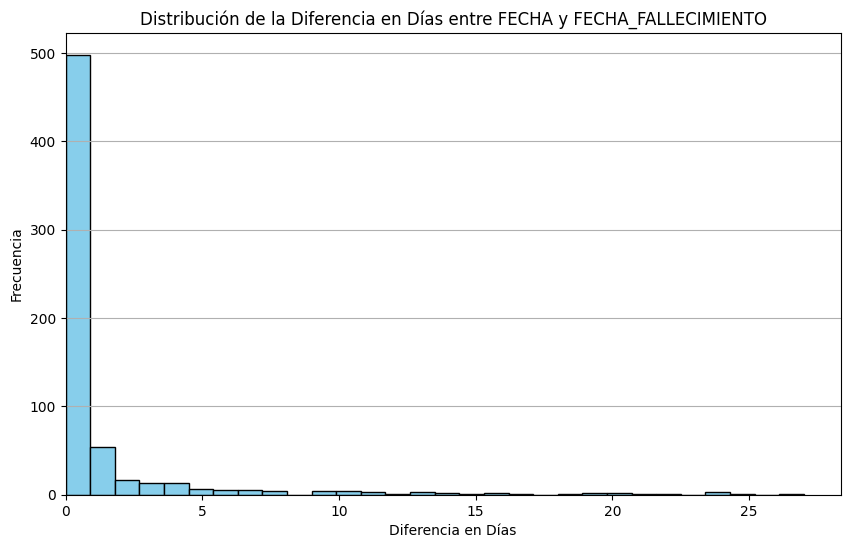

In [121]:
# Crear un histograma para visualizar la distribución de DIFERENCIA_DIAS
plt.figure(figsize=(10, 6))
plt.hist(homicidios_victimas['DIFERENCIA_DIAS'], bins=30, color='skyblue', edgecolor='black')  # Histograma con borde negro
plt.title('Distribución de la Diferencia en Días entre FECHA y FECHA_FALLECIMIENTO')
plt.xlabel('Diferencia en Días')
plt.ylabel('Frecuencia')
plt.xlim(left=0)  # Limitar el eje x a valores no negativos
plt.grid(axis='y')
plt.show()

----> Se puede observar que la mayoría de las víctimas en el conjunto de datos experimentaron fallecimientos inmediatos o en el mismo día del evento.

### Normalización de nombres y exportación archivos POST EDA-ETL

Para una mejor presentación se reorganizan y se renombran algunas columnas.

In [122]:
homicidios_victimas.columns

Index(['ID_hecho', 'FECHA', 'AAAA', 'MM', 'DD', 'ROL', 'VICTIMA', 'SEXO',
       'EDAD', 'FECHA_FALLECIMIENTO', 'FECHA_combinada', 'Fecha_coincide',
       'RANGO_ETARIO', 'DIFERENCIA_DIAS'],
      dtype='object')

In [123]:
# Renombrar columnas
homicidios_victimas.rename(columns={
    'ID_hecho': 'ID_HECHO',}, inplace=True)

In [124]:
# Eliminar columnas
homicidios_victimas.drop(columns=['FECHA_combinada', 'Fecha_coincide'], inplace=True)

In [125]:
#Reordenamiento de las columnas
# Obtener el orden actual de las columnas
columnas = list(homicidios_victimas.columns)

# Si 'RANGO_ETARIO' ya está en el DataFrame, eliminarla de la lista de columnas
if 'RANGO_ETARIO' in columnas:
    columnas.remove('RANGO_ETARIO')

# Reordenar las columnas moviendo 'RANGO_ETARIO' después de 'EDAD'
nueva_orden = (
    columnas[:columnas.index('EDAD') + 1] +  # Columnas hasta 'EDAD'
    ['RANGO_ETARIO'] +                       # Insertar 'RANGO_ETARIO' después de 'EDAD'
    columnas[columnas.index('EDAD') + 1:]    # Columnas después de 'EDAD'
)

# Reasignar el DataFrame con el nuevo orden de columnas
homicidios_victimas = homicidios_victimas[nueva_orden]

# Verificar el nuevo orden de las columnas
print(homicidios_victimas.columns)
homicidios_victimas.head()


Index(['ID_HECHO', 'FECHA', 'AAAA', 'MM', 'DD', 'ROL', 'VICTIMA', 'SEXO',
       'EDAD', 'RANGO_ETARIO', 'FECHA_FALLECIMIENTO', 'DIFERENCIA_DIAS'],
      dtype='object')


,ID_HECHO,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,RANGO_ETARIO,FECHA_FALLECIMIENTO,DIFERENCIA_DIAS
0,2016-0001,2016-01-01,2016,1,1,CONDUCTOR,MOTO,MASCULINO,19,Entre 11 y 20 años,2016-01-01 00:00:00,0.0
1,2016-0002,2016-01-02,2016,1,2,CONDUCTOR,AUTO,MASCULINO,70,Entre 61 y 70 años,2016-01-02 00:00:00,0.0
2,2016-0003,2016-01-03,2016,1,3,CONDUCTOR,MOTO,MASCULINO,30,Entre 21 y 30 años,2016-01-03 00:00:00,0.0
3,2016-0004,2016-01-10,2016,1,10,CONDUCTOR,MOTO,MASCULINO,18,Entre 11 y 20 años,SD,NaN
4,2016-0005,2016-01-21,2016,1,21,CONDUCTOR,MOTO,MASCULINO,29,Entre 21 y 30 años,2016-02-01 00:00:00,11.0


In [251]:
# Exportar a Excel
homicidios_victimas.to_excel("Víctima POST EDA-ETL.xlsx", index=False)

---
# ***VICTIMAS y HECHOS: Análisis y relaciones entre variables***
--- 


## 8- Combinación de datasets y Unificación de columnas

### Combinación de datasets

Partimos de los datasets post EDA/ETL:

In [127]:
## Improtación de datasets
hechos = pd.read_excel("M:\\Documentos\\Mai\\Henry\\Cursado\\P.I. 2\\1. Base de datos\\Post EDA-ETL\\Homicidios POST EDA-ETL.xlsx")
victimas = pd.read_excel("M:\\Documentos\\Mai\\Henry\\Cursado\\P.I. 2\\1. Base de datos\\Post EDA-ETL\\Víctima POST EDA-ETL.xlsx")

Combinar ambos df para poder tener la info concentrada para analisis y releación de variables

In [128]:
# Realizar el merge en base a la columna 'ID_HECHO'
combinado_hyv = pd.merge(hechos, victimas, on='ID_HECHO', how='inner') 
combinado_hyv.columns

Index(['ID_HECHO', 'N_VICTIMAS', 'FECHA_x', 'AAAA_x', 'MM_x', 'DD_x', 'HORA',
       'HH', 'DIA_SEMANA', 'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'CALLE',
       'ALTURA', 'CRUCE', 'DIRECCION_NORMALIZADA', 'ESQUINA', 'COMUNA',
       'XY (CABA)', 'LONGITUD', 'LATITUD', 'PARTICIPANTES', 'VICTIMA_x',
       'ACUSADO', 'FECHA_y', 'AAAA_y', 'MM_y', 'DD_y', 'ROL', 'VICTIMA_y',
       'SEXO', 'EDAD', 'RANGO_ETARIO', 'FECHA_FALLECIMIENTO',
       'DIFERENCIA_DIAS'],
      dtype='object')

### Análisis de columnas repetidas

- FECHAS

In [129]:
# Comparar las columnas y crear una nueva columna que indique si son iguales
combinado_hyv['FECHAS_IGUALES'] = (
    (combinado_hyv['FECHA_x'] == combinado_hyv['FECHA_y']) &
    (combinado_hyv['AAAA_x'] == combinado_hyv['AAAA_y']) &
    (combinado_hyv['MM_x'] == combinado_hyv['MM_y']) &
    (combinado_hyv['DD_x'] == combinado_hyv['DD_y'])
)

# Verificar el resultado
combinado_hyv[['FECHA_x', 'AAAA_x', 'MM_x', 'DD_x', 'FECHA_y', 'AAAA_y', 'MM_y', 'DD_y', 'FECHAS_IGUALES']].head()


,FECHA_x,AAAA_x,MM_x,DD_x,FECHA_y,AAAA_y,MM_y,DD_y,FECHAS_IGUALES
0,2016-01-01,2016,1,1,2016-01-01,2016,1,1,True
1,2016-01-02,2016,1,2,2016-01-02,2016,1,2,True
2,2016-01-03,2016,1,3,2016-01-03,2016,1,3,True
3,2016-01-10,2016,1,10,2016-01-10,2016,1,10,True
4,2016-01-21,2016,1,21,2016-01-21,2016,1,21,True


In [130]:
#Verificar las fechas diferentes
fechas_diferentes = combinado_hyv[~combinado_hyv['FECHAS_IGUALES']]
fechas_diferentes[['FECHA_x', 'AAAA_x', 'MM_x', 'DD_x', 'FECHA_y', 'AAAA_y', 'MM_y', 'DD_y', 'FECHAS_IGUALES']]

,FECHA_x,AAAA_x,MM_x,DD_x,FECHA_y,AAAA_y,MM_y,DD_y,FECHAS_IGUALES
204,2017-05-24,2017,5,24,2017-05-29,2017,5,29,False


---->Como no es significativa la diferencia mantenemos la fecha de hechos y eliminamos las otras columnas

In [131]:
combinado_hyv = combinado_hyv.drop(columns=['FECHA_y', 'AAAA_y', 'MM_y', 'DD_y','FECHAS_IGUALES'])
combinado_hyv.columns

Index(['ID_HECHO', 'N_VICTIMAS', 'FECHA_x', 'AAAA_x', 'MM_x', 'DD_x', 'HORA',
       'HH', 'DIA_SEMANA', 'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'CALLE',
       'ALTURA', 'CRUCE', 'DIRECCION_NORMALIZADA', 'ESQUINA', 'COMUNA',
       'XY (CABA)', 'LONGITUD', 'LATITUD', 'PARTICIPANTES', 'VICTIMA_x',
       'ACUSADO', 'ROL', 'VICTIMA_y', 'SEXO', 'EDAD', 'RANGO_ETARIO',
       'FECHA_FALLECIMIENTO', 'DIFERENCIA_DIAS'],
      dtype='object')

- VICTIMAS

In [132]:
# Comparar las columnas VICTIMA_y y VICTIMA_x y crear una nueva columna
combinado_hyv['VICTIMAS_IGUALES'] = combinado_hyv['VICTIMA_y'] == combinado_hyv['VICTIMA_x']

# Filtrar solo las filas donde las víctimas no son iguales
diferencias_victimas = combinado_hyv[~combinado_hyv['VICTIMAS_IGUALES']]

# Verificar el resultado
diferencias_victimas[['VICTIMA_x', 'VICTIMA_y', 'VICTIMAS_IGUALES']]

,VICTIMA_x,VICTIMA_y,VICTIMAS_IGUALES
602,PEATON_MOTO,PEATON,False
603,PEATON_MOTO,MOTO,False


---->Se decide conservar la columna victima_y ya que tiene la victima desglozada y eliminamos la otras columna

In [ ]:
combinado_hyv = combinado_hyv.drop(columns=['VICTIMA_x', 'VICTIMAS_IGUALES'])
combinado_hyv.columns
#Ya contamos con columnas sin info repetida

Se renombrar las columnas duplicadas

In [134]:
# Renombrar las columnas especificadas
combinado_hyv = combinado_hyv.rename(columns={
    'FECHA_x': 'FECHA',
    'AAAA_x': 'AÑO',
    'MM_x': 'MM',
    'DD_x': 'DD',
    'VICTIMA_y': 'VICTIMA'})

In [135]:
combinado_hyv.columns

Index(['ID_HECHO', 'N_VICTIMAS', 'FECHA', 'AÑO', 'MM', 'DD', 'HORA', 'HH',
       'DIA_SEMANA', 'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'CALLE', 'ALTURA',
       'CRUCE', 'DIRECCION_NORMALIZADA', 'ESQUINA', 'COMUNA', 'XY (CABA)',
       'LONGITUD', 'LATITUD', 'PARTICIPANTES', 'ACUSADO', 'ROL', 'VICTIMA',
       'SEXO', 'EDAD', 'RANGO_ETARIO', 'FECHA_FALLECIMIENTO',
       'DIFERENCIA_DIAS'],
      dtype='object')

Exportamos df combinado

In [22]:
# Exportar a Excel
combinado_hyv.to_excel("Hechos + Víctimas POST EDA-ETL.xlsx", index=False)

Dataset definitivo

In [136]:

df = pd.read_excel("M:\\Documentos\\Mai\\Henry\\Cursado\\P.I. 2\\1. Base de datos\\Post EDA-ETL\\Hechos + Víctimas POST EDA-ETL.xlsx")
df.columns

Index(['ID_HECHO', 'N_VICTIMAS', 'FECHA', 'AÑO', 'MM', 'DD', 'HORA', 'HH',
       'RANGO_HORARIO', 'DIA_SEMANA', 'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE',
       'CALLE', 'ALTURA', 'CRUCE', 'DIRECCION_NORMALIZADA', 'ESQUINA',
       'COMUNA', 'XY (CABA)', 'LONGITUD', 'LATITUD', 'PARTICIPANTES',
       'ACUSADO', 'ROL', 'VICTIMA', 'SEXO', 'EDAD', 'RANGO_ETARIO',
       'FECHA_FALLECIMIENTO', 'DIFERENCIA_DIAS'],
      dtype='object')

## 9- ANÁLISIS TEMPORAL

#### ***Objetivo:*** Se realiza este análisis en busca de obtener conclusiones  sobre posibles tendencias temporales y/o estacionales que nos permitan tomar medidas consistentes al resultado del mismo.

#### i. ¿Cuál ha sido la tendencia a lo largo de los años bajo análisis?


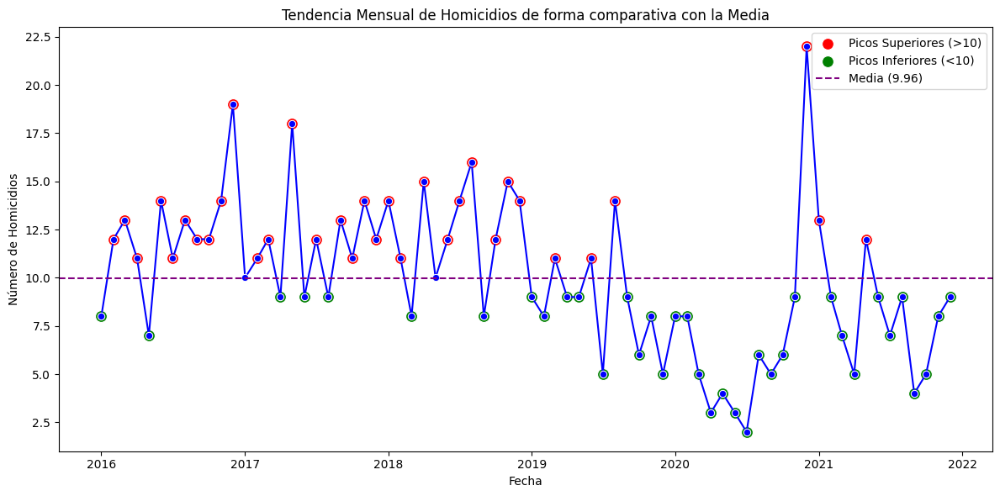

In [138]:
# Agrupar por mes y contar homicidios
homicidios_por_mes = df.groupby(df['FECHA'].dt.to_period('M')).size().reset_index(name='Num_homicidios')

# Convertir el período a fecha para facilitar la visualización
homicidios_por_mes['FECHA'] = homicidios_por_mes['FECHA'].dt.to_timestamp()

# Calcular la media de homicidios
media_homicidios = homicidios_por_mes['Num_homicidios'].mean()

# Crear gráfico de líneas con Seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(x='FECHA', y='Num_homicidios', data=homicidios_por_mes, marker='o', color='blue')

# Marcar los picos superiores (>10 homicidios)
picos_superiores = homicidios_por_mes[homicidios_por_mes['Num_homicidios'] > 10]
sns.scatterplot(x='FECHA', y='Num_homicidios', data=picos_superiores, color='red', s=100, label='Picos Superiores (>10)', marker='o')

# Marcar los picos inferiores (<10 homicidios)
picos_inferiores = homicidios_por_mes[homicidios_por_mes['Num_homicidios'] < 10]
sns.scatterplot(x='FECHA', y='Num_homicidios', data=picos_inferiores, color='green', s=100, label='Picos Inferiores (<10)', marker='o')

# Añadir línea de la media de Num_homicidios
plt.axhline(y=media_homicidios, color='purple', linestyle='--', label=f'Media ({media_homicidios:.2f})')

# Añadir títulos y etiquetas
plt.title('Tendencia Mensual de Homicidios de forma comparativa con la Media')
plt.xlabel('Fecha')
plt.ylabel('Número de Homicidios')

# Ajustar layout y mostrar leyenda
plt.tight_layout()
plt.legend()
plt.show()


#### ***Conclusiones:*** 
1.	Alta Variabilidad: El número de victimas no sigue un patrón lineal o estacional claro. Existen meses con cifras muy superiores a la media y otros con cifras significativamente inferiores.
2.	Tendencia a Largo Plazo: A pesar de las fluctuaciones, se aprecia una tendencia general a la baja en los últimos 3 años, sobre todo en 2020 posiblemente a causa de la pandemia, pero con un gran sobre salto en Diciembre del mismo año.
3.	Presencia de Picos: Se identifican meses con un número de homicidios significativamente superior a la media (picos superiores), así como meses con cifras muy inferiores (picos inferiores).Sin embargo la media puede verse afectada por los valores extemos (inferiores) de la pandemia.


#### ii.	¿Se pueden detectar ciertos patrones repetidos en los diferentes años bajo análisis?

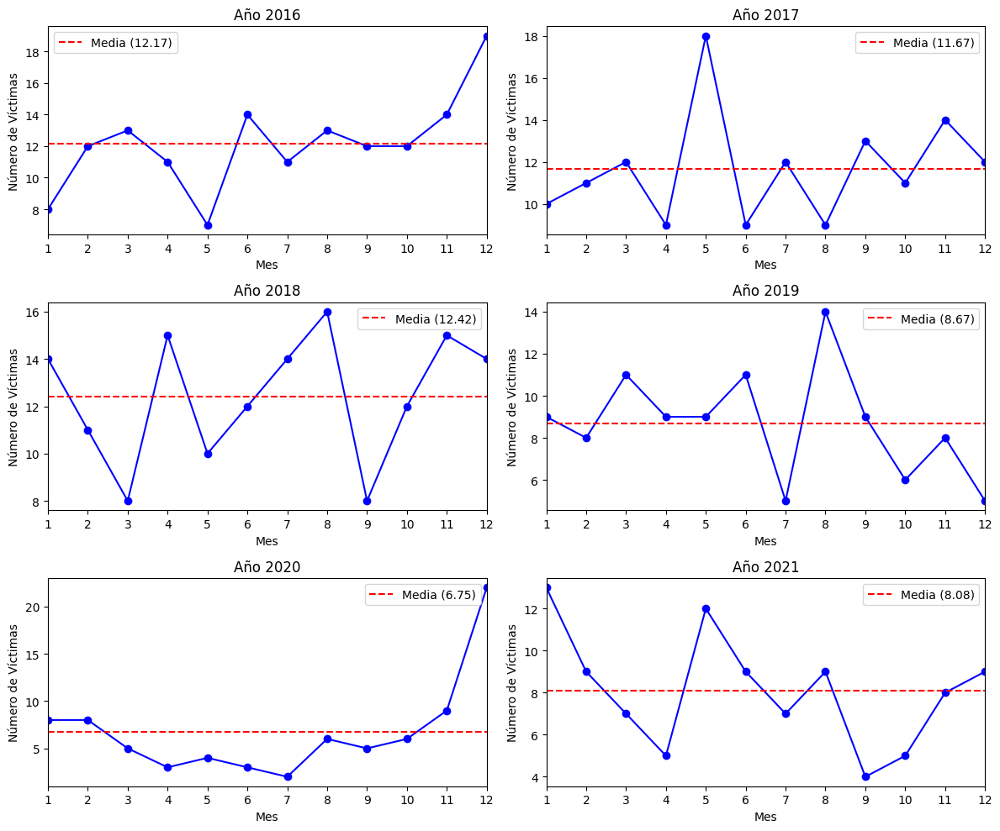

In [139]:
# Agrupar por Año y Mes, sumar la cantidad de víctimas
df_agrupado = df.groupby(['AÑO', 'MM'])['N_VICTIMAS'].sum().reset_index()

# Obtener los años únicos para hacer un gráfico por año
años = df_agrupado['AÑO'].unique()

# Crear una figura con 2 columnas y 3 filas
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))  # Ajustar el tamaño según sea necesario

# Aplanar los ejes para recorrerlos fácilmente
axes = axes.flatten()

# Graficar cada año en su propio subplot
for i, year in enumerate(años):
    data_year = df_agrupado[df_agrupado['AÑO'] == year]
    
    # Calcular la media de víctimas para el año en cuestión
    media_victimas = data_year['N_VICTIMAS'].mean()
    
    # Graficar los datos del año actual
    axes[i].plot(data_year['MM'], data_year['N_VICTIMAS'], marker='o', linestyle='-', color='b')
    
    # Añadir la línea de la media
    axes[i].axhline(y=media_victimas, color='r', linestyle='--', label=f'Media ({media_victimas:.2f})')
    
    # Añadir títulos y etiquetas
    axes[i].set_title(f'Año {year}')
    axes[i].set_xlabel('Mes')
    axes[i].set_ylabel('Número de Víctimas')
    axes[i].set_xticks(range(1, 13))  # Asegurarse de que se muestren todos los meses
    axes[i].set_xlim(1, 12)  # Limitar el eje X de 1 a 12 (meses)
    
    # Mostrar leyenda para la media
    axes[i].legend()

# Ajustar el diseño del gráfico
plt.tight_layout()
plt.show()



#### ***Conclusiones:*** 
1.	No se observan patrones repetidos sino una gran variabilidad en el número de víctimas a lo largo del tiempo, tanto a nivel mensual como anual.
2. No se detectan estacionalidads muy marcadas dentro de los diferentes años.

#### iii. ¿Se pueden detectar los años, meses, días de la semana y horario con mayor y menor presencia de víctimas?

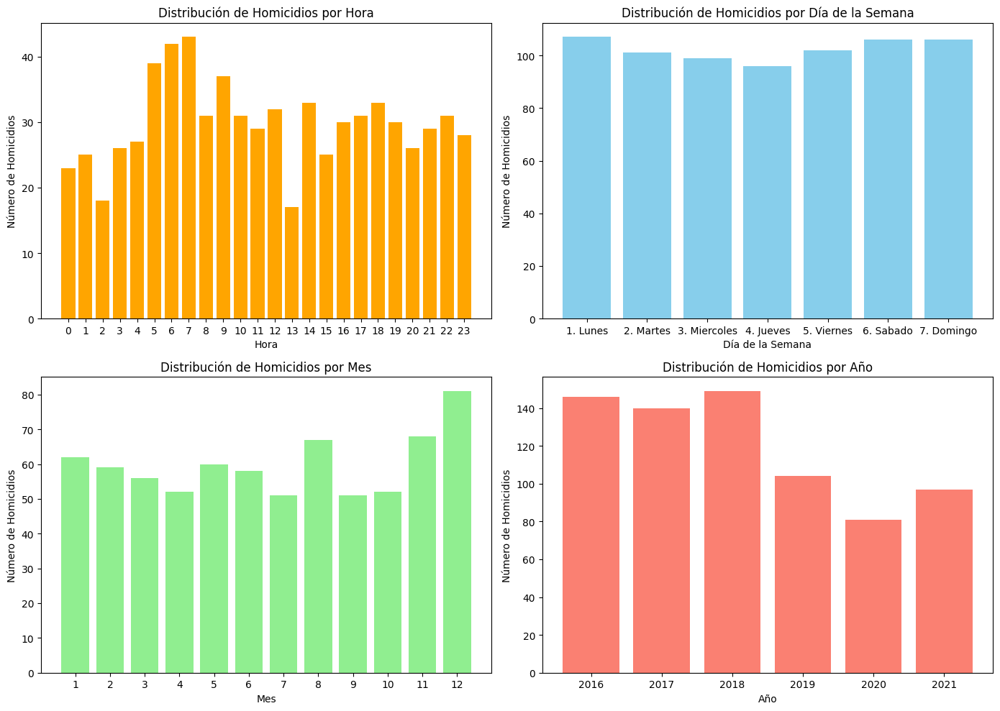

In [141]:
# Agrupar por Día de la Semana
distribucion_dia_semana = df['DIA_SEMANA'].value_counts().sort_index()

# Agrupar por Mes (MM)
distribucion_mes = df['MM'].value_counts().sort_index()

# Agrupar por Año (AÑO)
distribucion_año = df['AÑO'].value_counts().sort_index()

# Agrupar por Hora (HH)
# Convertir la columna 'HH' a numérica, reemplazar valores no numéricos por NaN
df['HH'] = pd.to_numeric(df['HH'], errors='coerce')
df_filtrado = df.dropna(subset=['HH'])
distribucion_hora = df_filtrado['HH'].value_counts().sort_index()

# Crear la figura y los 4 subplots (2x2)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14  , 10))

# Gráfico de distribución por Día de la Semana
axes[0, 1].bar(distribucion_dia_semana.index, distribucion_dia_semana.values, color='skyblue')
axes[0, 1].set_title('Distribución de Homicidios por Día de la Semana')
axes[0, 1].set_xlabel('Día de la Semana')
axes[0, 1].set_ylabel('Número de Homicidios')

# Gráfico de distribución por Mes (MM)
axes[1, 0].bar(distribucion_mes.index, distribucion_mes.values, color='lightgreen')
axes[1, 0].set_title('Distribución de Homicidios por Mes')
axes[1, 0].set_xlabel('Mes')
axes[1, 0].set_xticks(range(1, 13))
axes[1, 0].set_ylabel('Número de Homicidios')

# Gráfico de distribución por Año (AÑO)
axes[1, 1].bar(distribucion_año.index, distribucion_año.values, color='salmon')
axes[1, 1].set_title('Distribución de Homicidios por Año')
axes[1, 1].set_xlabel('Año')
axes[1, 1].set_ylabel('Número de Homicidios')

# Gráfico de distribución por Hora (HH)
axes[0, 0].bar(distribucion_hora.index, distribucion_hora.values, color='orange')
axes[0, 0].set_title('Distribución de Homicidios por Hora')
axes[0, 0].set_xlabel('Hora')
axes[0, 0].set_xticks(range(0, 24))
axes[0, 0].set_ylabel('Número de Homicidios')

# Ajustar el espaciado
plt.tight_layout()

# Mostrar el gráfico
plt.show()


#### ***Conclusiones:*** 
1.	Distribución por Hora: Se observa un pico en el número de homicidios durante las horas nocturnas, especialmente entre las 5 AM y las 7 AM.
2.	Distribución por Día de la Semana: Los fines de semana, especialmente los sábados y domingos, muestran los índices altos de homicidios. Esto podría estar relacionado con el aumento de la actividad social y el consumo de alcohol durante estos días. Los lunes también tienen valores altos. Sin embargo, a grandes rasgos se presenta una distribución más uniforme, aunque con una ligera tendencia a la baja durante la semana en comparación con los fines de semana.
3.	Distribución por Mes: Se observa una variabilidad en el número de homicidios a lo largo de los meses del año, con un patrón estacional hacia fin de año, sobre todo Noviembre y Diciembre.
4.	Distribución por Año: Si bien hay fluctuaciones anuales, se puede apreciar una tendencia general hacia la baja, sobre todo en los últimos tres  años.

#### iv.	¿Existe algún tipo de relación entre el día del evento y el horario con mayor frecuencia de víctimas fatales ?

In [142]:
# Definir los límites de las franjas horarias
franjas = [0, 4, 8, 12, 16, 20, 24]

# Definir las etiquetas correspondientes a cada franja
etiquetas = ['0 a 4 hs.', '4 a 8 hs.', '8 a 12 hs.', '12 a 16 hs.', '16 a 20 hs.', '20 a 24 hs.']

# Crear la nueva columna 'FRANJA_HORARIA' usando pd.cut()
df['FRANJA_HORARIA'] = pd.cut(df['HH'], bins=franjas, labels=etiquetas, right=False)


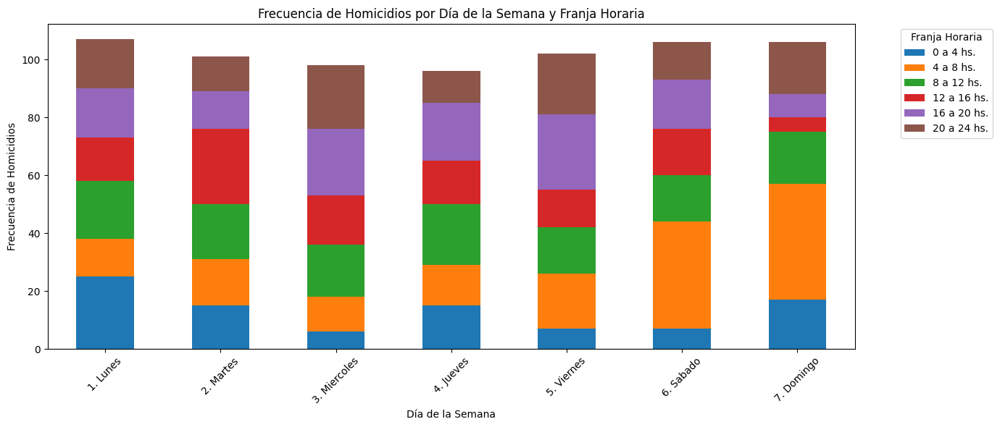

In [143]:

# Crear una tabla de frecuencia
tabla_frecuencia = df.groupby(['DIA_SEMANA', 'FRANJA_HORARIA']).size().reset_index(name='FRECUENCIA')

# Pivotar la tabla para que 'FRANJA_HORARIA' se convierta en columnas
tabla_pivotada = tabla_frecuencia.pivot(index='DIA_SEMANA', columns='FRANJA_HORARIA', values='FRECUENCIA').fillna(0)

# Crear el gráfico de barras apiladas
plt.figure(figsize=(12, 6))
tabla_pivotada.plot(kind='bar', stacked=True, ax=plt.gca())

# Personalizar el gráfico
plt.title('Frecuencia de Homicidios por Día de la Semana y Franja Horaria')
plt.xlabel('Día de la Semana')
plt.ylabel('Frecuencia de Homicidios')
plt.xticks(rotation=45)

# Ajustar layout y mostrar leyenda
plt.tight_layout()
plt.legend(title='Franja Horaria', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



#### ***Conclusiones:*** 
1.	Concentración en Fines de Semana: Es evidente una mayor concentración de homicidios durante los fines de semana (sábado y domingo), en comparación con el conjunto de días entre semana.
2.	Horas Nocturnas Críticas: Durante fines de semana las horas nocturnas, especialmente entre las 04:00 y las 08:00, presentan los índices más altos. Durante la semana se encuentra más uniforme la distribución según le horario.


## 10- ANÁLISIS GEOGRÁFICO

#### ***Objetivo:*** Se realiza este análisis de las variables geográficas que nos permitirá identificar patrones espaciales en la ocurrencia de accidentes de tráfico, lo cual es fundamental para diseñar estrategias de prevención y mitigación más efectivas

#### i.	¿Dónde ocurren la mayor parte de los accidentes? ¿Se pueden identificar las zonas con mayor concentración de accidentes?

In [149]:
# Crear un mapa centrado en la ciudad 
mapa = folium.Map(location=[-34.61, -58.38], zoom_start=13,)

# Crear una lista de coordenadas para el mapa de calor
coordenadas = df[['LATITUD', 'LONGITUD']].dropna().values.tolist()

# Añadir el mapa de calor
HeatMap(coordenadas).add_to(mapa)
mapa

In [15]:
# Contar la frecuencia de cada cruce para luego obtener las 5 direcciones con mayor accidentes fatales
frecuencia_direccion = df['DIRECCION_NORMALIZADA'].value_counts()

# Obtener las 5 direcc más frecuentes
top_5_direcc = frecuencia_direccion.head(5)
top_5_direcc.head()

DIRECCION_NORMALIZADA
27 DE FEBRERO AV. y ESCALADA AV.                       5
PAZ, GRAL. AV. y DEL LIBERTADOR AV.                    4
PAZ, GRAL. AV. y BALBIN, RICARDO, DR. AV.              4
ALCORTA, AMANCIO AV. y BONAVENA, OSCAR NATALIO         3
ACHAVAL RODRIGUEZ, T., DR. AV. y VILLAFLOR, AZUCENA    3
Name: count, dtype: int64

#### ***Conclusiones:*** 
Mediante el mapa se pueden ver de color rojo la zonas con mas de accidentes fatales. A su vez se obtienen las 5 direcciones con mayor frecuencia.
* a.	27 DE FEBRERO AV. y ESCALADA AV.
* b.	PAZ, GRAL. AV. y BALBIN, RICARDO, DR. AV.
* c.	PAZ, GRAL. AV. y DEL LIBERTADOR AV. 
* d.	CASTILLO, RAMON S., PRES. AV. y CALLE 12
* e.	PAZ, GRAL. AV. y DE LOS CORRALES AV.


#### ii.	¿Existen comunas con mayor frecuencia de victimas?

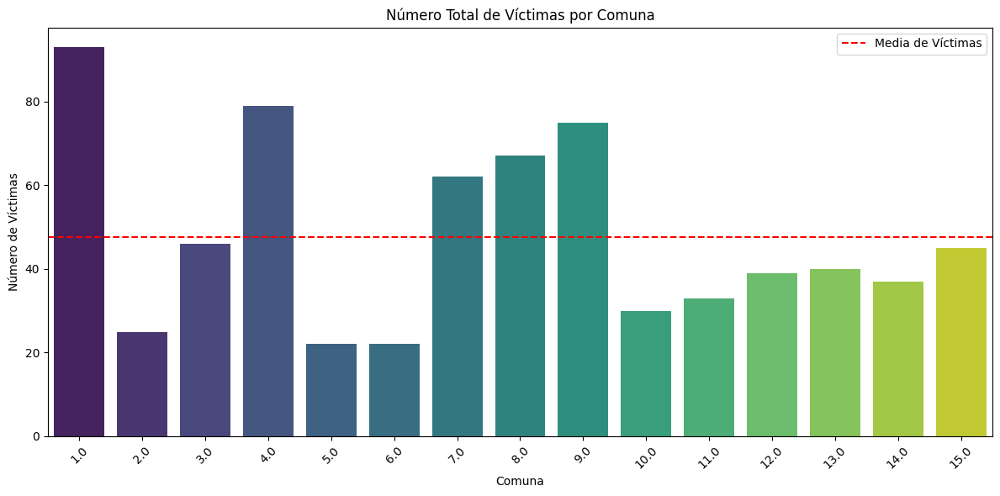

In [151]:
# Agrupar por comuna y sumar el número de víctimas
victimas_por_comuna = df.groupby('COMUNA')['N_VICTIMAS'].sum().reset_index()

# Ordenar los resultados por número de víctimas
victimas_por_comuna = victimas_por_comuna.sort_values(by='N_VICTIMAS', ascending=False)

# Calcular la media del número de víctimas
media_victimas = victimas_por_comuna['N_VICTIMAS'].mean()

# Crear el gráfico de barras con Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=victimas_por_comuna, x='COMUNA', y='N_VICTIMAS', palette='viridis')

# Trazar la línea de la media
plt.axhline(y=media_victimas, color='red', linestyle='--', label='Media de Víctimas')

plt.title('Número Total de Víctimas por Comuna')
plt.xlabel('Comuna')
plt.ylabel('Número de Víctimas')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout() 
plt.show()



#### ***Conclusiones:*** Las 5 comunas que tienen frecuencia superior a la media son: 1, 4, 7, 8 y 9

#### iii. ¿Qué tipo de vías son más peligrosas?¿Hay diferencias significativas en el número de accidentes en esquinas o es equilibrado?

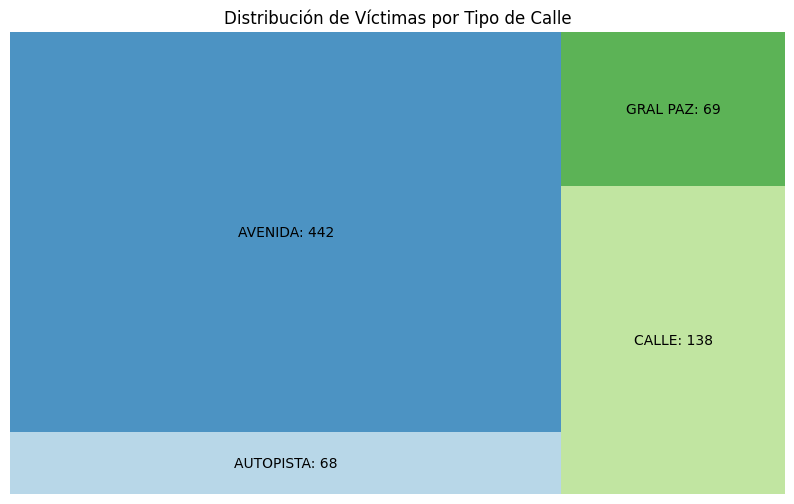

In [171]:
# Agrupar los datos por 'TIPO_DE_CALLE' y contar el número de víctimas
victimas_por_calle = df.groupby('TIPO_DE_CALLE')['N_VICTIMAS'].sum()

# Configurar los tamaños de los rectángulos del treemap (proporcional a la cantidad de víctimas)
sizes = victimas_por_calle.values

# Crear etiquetas que incluyan el tipo de calle y la cantidad total
labels = [f"{tipo}: {cantidad}" for tipo, cantidad in zip(victimas_por_calle.index, victimas_por_calle.values)]

# Crear el gráfico Treemap
plt.figure(figsize=(10, 6))
squarify.plot(sizes=sizes, label=labels, alpha=0.8, color=plt.cm.Paired.colors)

# Añadir título
plt.title('Distribución de Víctimas por Tipo de Calle')

# Eliminar los ejes para un mejor diseño visual
plt.axis('off')

# Mostrar el gráfico
plt.show()



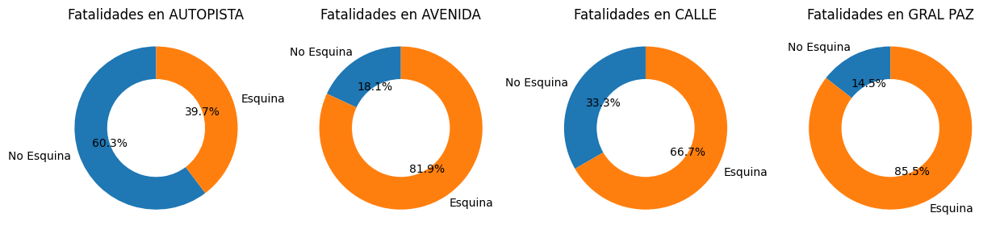

In [162]:
# Agrupar los datos por 'TIPO_DE_CALLE' y 'ESQUINA'
grupo = df.groupby(['TIPO_DE_CALLE', 'ESQUINA']).size().unstack(fill_value=0)

fig, axs = plt.subplots(1, len(grupo), figsize=(15, 6))

for i, tipo_calle in enumerate(grupo.index):
    axs[i].pie(grupo.loc[tipo_calle], labels=['No Esquina', 'Esquina'], autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.4))
    axs[i].set_title(f'Fatalidades en {tipo_calle}')

plt.show()


#### ***Conclusiones:***
* a. Superioridad notoria de fatalidades en avenidas, luego en calles y similaridad entre autpistas y Gral Paz, siendo estas últimas donde menos frecuencia de homicidios suceden.
* b. Alta proporción de accidentes en esquinas: La proporción de accidentes en esquinas es significativamente mayor que aquellos que ocurren en tramos rectos. Esto sugiere que las intersecciones viales son puntos críticos en términos de seguridad vial. En Autopistas es el unico tipo de calle donde no predominan las esquinas.



#### iv.	¿Existen intersecciones particularmente peligrosas? ¿En qué tipo de calle?

In [174]:
# Conociendo el top 5 de direcciones con mas fatalidades, revisar si son esquinas
top_5_direcc = df.groupby('DIRECCION_NORMALIZADA')['N_VICTIMAS'].sum().nlargest(5)

# Filtrar el DataFrame para obtener las filas que corresponden a las 5 direcciones más frecuentes
esquinas_top_5 = df[df['DIRECCION_NORMALIZADA'].isin(top_5_direcc.index)]

# Comprobar si son esquinas
esquinas_top_5_resultado = esquinas_top_5[['DIRECCION_NORMALIZADA', 'ESQUINA', 'COMUNA','TIPO_DE_CALLE']].drop_duplicates()

# Mostrar resultados
esquinas_top_5_resultado


,DIRECCION_NORMALIZADA,ESQUINA,COMUNA,TIPO_DE_CALLE
5,27 DE FEBRERO AV. y ESCALADA AV.,True,8.0,AVENIDA
23,"ALCORTA, AMANCIO AV. y BONAVENA, OSCAR NATALIO",True,4.0,AVENIDA
33,"PAZ, GRAL. AV. y DEL LIBERTADOR AV.",True,13.0,GRAL PAZ
152,"PAZ, GRAL. AV. y BALBIN, RICARDO, DR. AV.",True,12.0,GRAL PAZ
173,"ACHAVAL RODRIGUEZ, T., DR. AV. y VILLAFLOR, AZ...",True,1.0,AVENIDA


#### ***Conclusiones:***
*   a.	Despues de analizar las 5 direcciones con mayor frecuencia de fatalidades se puede observar que las mismas efectivamente son todas esquinas y se dan principalmente en avenidas y sobre Gral Paz.

## 11- ANÁLISIS SOBRE PARTICIPANTES

#### ***Objetivo:*** Se realiza el presente análisis para proporcionar una comprensión integral de los factores que contribuyen a la vulnerabilidad en accidentes viales, centrándose en las víctimas y sus interacciones con los acusado

#### i. ¿Qué tipo de actor está mayormente involucrado en accidentes como víctima?

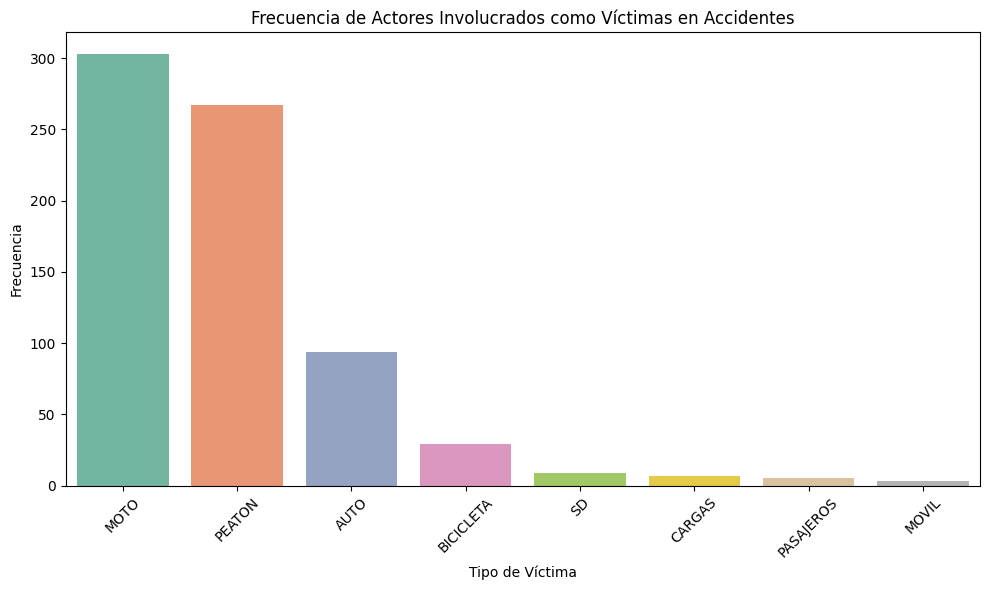

In [175]:
# Contar la frecuencia de cada tipo de víctima
frecuencia_victima = df['VICTIMA'].value_counts().reset_index()

# Renombrar las columnas para mejor legibilidad
frecuencia_victima.columns = ['VICTIMA', 'FRECUENCIA']
# Crear el gráfico de barras con Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=frecuencia_victima, x='VICTIMA', y='FRECUENCIA', palette='Set2')

# Personalizar el gráfico
plt.title('Frecuencia de Actores Involucrados como Víctimas en Accidentes')
plt.xlabel('Tipo de Víctima')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


Porcentaje de víctimas tipo PEATÓN: 37.24%
Porcentaje de víctimas tipo MOTO: 42.26%


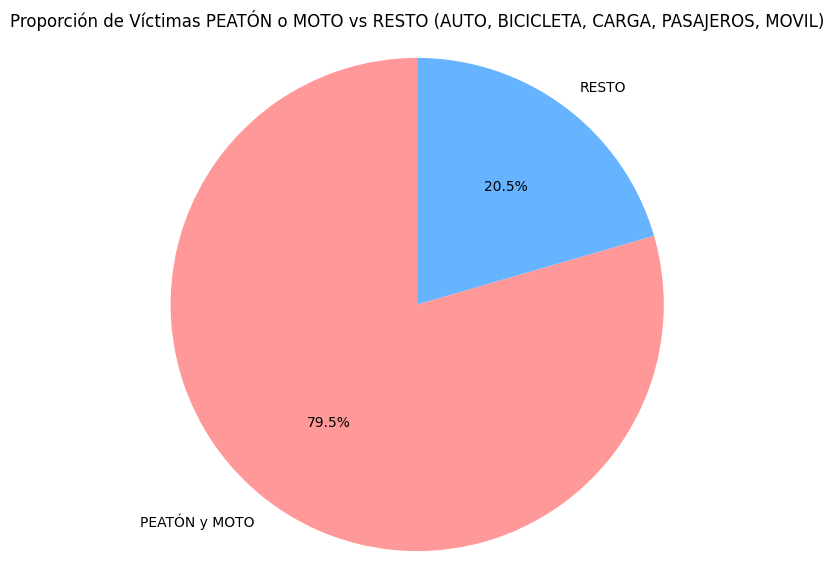

In [176]:
# Contar la frecuencia total de víctimas
total_victimas = df['VICTIMA'].count()

# Filtrar la cantidad de víctimas de tipo "PEATÓN" y "MOTO"
peaton_victimas = frecuencia_victima.loc[frecuencia_victima['VICTIMA'] == 'PEATON', 'FRECUENCIA'].values[0]
moto_victimas = frecuencia_victima.loc[frecuencia_victima['VICTIMA'] == 'MOTO', 'FRECUENCIA'].values[0]

# Calcular el porcentaje de "PEATÓN" y "MOTO"
porcentaje_peaton = (peaton_victimas / total_victimas) * 100
porcentaje_moto = (moto_victimas / total_victimas) * 100

# Mostrar los porcentajes
print(f'Porcentaje de víctimas tipo PEATÓN: {porcentaje_peaton:.2f}%')
print(f'Porcentaje de víctimas tipo MOTO: {porcentaje_moto:.2f}%')

# Sumar las víctimas de tipo "PEATÓN" y "MOTO"
peaton_moto_victimas = peaton_victimas + moto_victimas

# Calcular las víctimas restantes
resto_victimas = total_victimas - peaton_moto_victimas

# Definir los datos para el gráfico de torta
labels = ['PEATÓN y MOTO', 'RESTO']
sizes = [peaton_moto_victimas, resto_victimas]
colors = ['#ff9999','#66b3ff']

# Crear el gráfico de torta
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)

# Asegurar que el gráfico esté en formato circular
plt.axis('equal')  
plt.title('Proporción de Víctimas PEATÓN o MOTO vs RESTO (AUTO, BICICLETA, CARGA, PASAJEROS, MOVIL)')
plt.show()

#Practicamente las MOTOS o PEATONES representan en conjunto el 80% de las victimas

#### ***Conclusiones:***
* La mayoria de las victimas son Peatones o Motos. En conjunto representan prácticamente el 80% del total de victimas fatales.

#### ii.¿Hay alguna tendencia de género entre los diferentes rangos etarios de las víctimas?

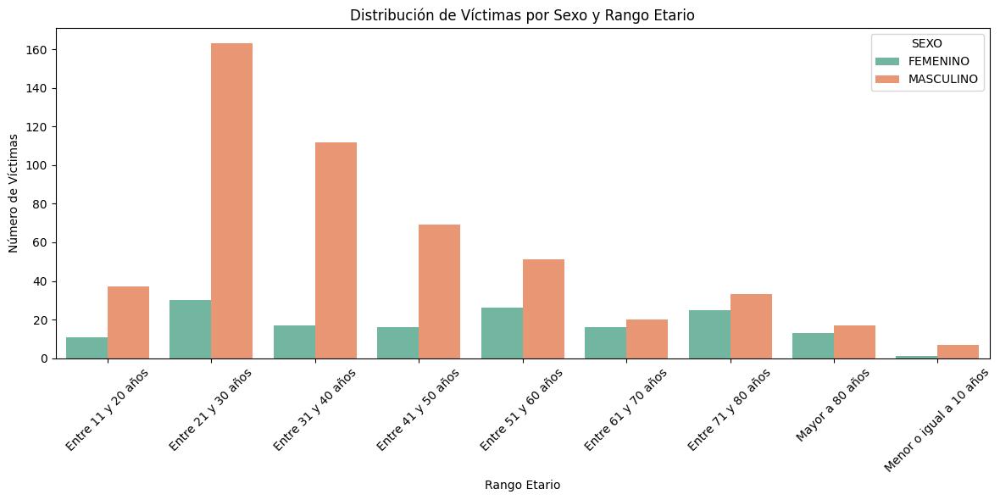

In [179]:
# Agrupar por 'RANGO_ETARIO' y 'SEXO', y contar el número de víctimas
tendencia_genero = df.groupby(['RANGO_ETARIO', 'SEXO']).size().reset_index(name='FRECUENCIA')

# Ordenar por rango etario para facilitar la visualización
tendencia_genero = tendencia_genero.sort_values(by='RANGO_ETARIO')

# Crear un gráfico de barras apilado para comparar la frecuencia por sexo en cada rango etario
plt.figure(figsize=(12, 6))
sns.barplot(data=tendencia_genero, x='RANGO_ETARIO', y='FRECUENCIA', hue='SEXO', palette='Set2')

# Personalizar el gráfico
plt.title('Distribución de Víctimas por Sexo y Rango Etario')
plt.xlabel('Rango Etario')
plt.ylabel('Número de Víctimas')
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

#### ***Conclusiones:***
* Se puede observar como el genero masculino es ampliamente superior al femenino, dicha brecha se acentua más entre 21 y 40 años 

#### iii.¿Existe algun perfil que pueda detectarse con mayor indice de fatalidad respecto al ROL, SEXO y RANGO ETARIO?

In [180]:

# Agrupar por 'ROL', 'SEXO' y 'RANGO_ETARIO', y contar el número de víctimas
perfil_accidentes = df.groupby(['ROL', 'SEXO', 'RANGO_ETARIO']).size().reset_index(name='FRECUENCIA')

# Ordenar los resultados por frecuencia de mayor a menor
perfil_accidentes_ordenado = perfil_accidentes.sort_values(by='FRECUENCIA', ascending=False)

# Mostrar el top 5 perfiles con mayor cantidad de accidentes
top_5_perfiles = perfil_accidentes_ordenado.head(5)
print(top_5_perfiles)



          ROL       SEXO        RANGO_ETARIO  FRECUENCIA
19  CONDUCTOR  MASCULINO  Entre 21 y 30 años         127
20  CONDUCTOR  MASCULINO  Entre 31 y 40 años          74
21  CONDUCTOR  MASCULINO  Entre 41 y 50 años          40
51     PEATON  MASCULINO  Entre 31 y 40 años          28
55     PEATON  MASCULINO  Entre 71 y 80 años          25


#### ***Conclusiones:***
Despues de analizar los grupos más vulnerables o expuestos en accidentes viales se puede apreciar una fuerte inlinación hacia el género masculino respecto a la cantidad de de victimas fatales, pudiendo destacar que en su mayoria resultan ser:
* conductores masculinos entre 21 y 30 años 
* peatones masculinos entre 31 y 40 
* Es importante destacar también, ya que aparecen dentro del top, peatones que son gente mayor entre 71 y 80 años.


#### iv. ¿Hay patrón que muestre la relación entre VICTIMA-ACUSADO que se repita con mayor frecuencia?

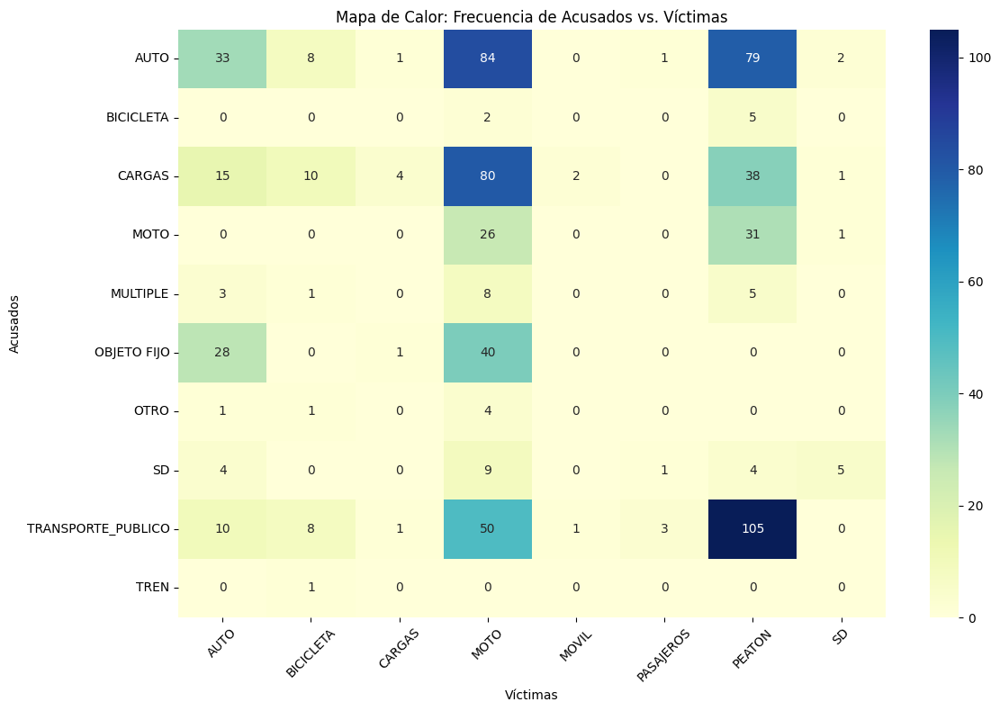

In [181]:
# Crear la tabla de contingencia
tabla_contingencia = pd.crosstab(df['ACUSADO'], df['VICTIMA'])

# Configurar el tamaño del gráfico
plt.figure(figsize=(12, 8))

# Crear el mapa de calor
sns.heatmap(tabla_contingencia, annot=True, fmt='d', cmap='YlGnBu', cbar=True)

# Personalizar el gráfico
plt.title('Mapa de Calor: Frecuencia de Acusados vs. Víctimas')
plt.xlabel('Víctimas')
plt.ylabel('Acusados')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()  # Ajustar el layout
plt.show()


In [182]:
# Contar la frecuencia de cada participante
frecuencia_participantes = df['PARTICIPANTES'].value_counts()
    # Obtener los 10 participantes más frecuentes
top_participantes = frecuencia_participantes.head(10)
top_participantes

PARTICIPANTES
PEATON-TRANSPORTE_PUBLICO    105
MOTO-AUTO                     84
MOTO-CARGAS                   80
PEATON-AUTO                   79
MOTO-TRANSPORTE_PUBLICO       50
MOTO-OBJETO FIJO              40
PEATON-CARGAS                 38
AUTO-AUTO                     33
PEATON-MOTO                   30
AUTO-OBJETO FIJO              26
Name: count, dtype: int64

#### ***Conclusiones:***
Se puede observar como la mayor cantidad de víctimas se da en las siguientes relaciones ACUSADO - VICTIMA:
* PEATON-TRANSPORTE_PUBLICO    105
* MOTO-AUTO                     84
* MOTO-CARGAS                   80
* PEATON-AUTO                   79